# Implementing a Neural Network
In this exercise we will develop a neural network with fully-connected layers to perform classification, and test it out on the CIFAR-10 dataset.

In [1]:
# A bit of setup

import numpy as np
import matplotlib.pyplot as plt

from cs231n.classifiers.neural_net_ref import TwoLayerNet

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

def rel_error(x, y):
    """ returns relative error """
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

We will use the class `TwoLayerNet` in the file `cs231n/classifiers/neural_net.py` to represent instances of our network. The network parameters are stored in the instance variable `self.params` where keys are string parameter names and values are numpy arrays. Below, we initialize toy data and a toy model that we will use to develop your implementation.

In [2]:
# Create a small net and some toy data to check your implementations.
# Note that we set the random seed for repeatable experiments.

input_size = 4
hidden_size = 10
num_classes = 3
num_inputs = 5

def init_toy_model():
    np.random.seed(0)
    return TwoLayerNet(input_size, hidden_size, num_classes, std=1e-1)

def init_toy_data():
    np.random.seed(1)
    X = 10 * np.random.randn(num_inputs, input_size)
    y = np.array([0, 1, 2, 2, 1])
    return X, y

net = init_toy_model()
X, y = init_toy_data()

In [3]:
print(X)

[[ 16.24345364  -6.11756414  -5.28171752 -10.72968622]
 [  8.65407629 -23.01538697  17.44811764  -7.61206901]
 [  3.19039096  -2.49370375  14.62107937 -20.60140709]
 [ -3.22417204  -3.84054355  11.33769442 -10.99891267]
 [ -1.72428208  -8.77858418   0.42213747   5.82815214]]


In [4]:
print('W1')
print(net.params['W1'])
print('b1')
print(net.params['b1'])
print('W2')
print(net.params['W2'])
print('b2')
print(net.params['b2'])

W1
[[ 0.17640523  0.04001572  0.0978738   0.22408932  0.1867558  -0.09772779
   0.09500884 -0.01513572 -0.01032189  0.04105985]
 [ 0.01440436  0.14542735  0.07610377  0.0121675   0.04438632  0.03336743
   0.14940791 -0.02051583  0.03130677 -0.08540957]
 [-0.25529898  0.06536186  0.08644362 -0.0742165   0.22697546 -0.14543657
   0.00457585 -0.01871839  0.15327792  0.14693588]
 [ 0.01549474  0.03781625 -0.08877857 -0.19807965 -0.03479121  0.0156349
   0.12302907  0.12023798 -0.03873268 -0.03023028]]
b1
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
W2
[[-0.1048553  -0.14200179 -0.17062702]
 [ 0.19507754 -0.05096522 -0.04380743]
 [-0.12527954  0.07774904 -0.16138978]
 [-0.02127403 -0.08954666  0.03869025]
 [-0.05108051 -0.11806322 -0.00281822]
 [ 0.04283319  0.00665172  0.03024719]
 [-0.06343221 -0.03627412 -0.06724604]
 [-0.03595532 -0.08131463 -0.17262826]
 [ 0.01774261 -0.04017809 -0.16301983]
 [ 0.04627823 -0.09072984  0.00519454]]
b2
[0. 0. 0.]


In [18]:
print(y)

[0 1 2 2 1]


# Forward pass: compute scores
Open the file `cs231n/classifiers/neural_net.py` and look at the method `TwoLayerNet.loss`. This function is very similar to the loss functions you have written for the SVM and Softmax exercises: It takes the data and weights and computes the class scores, the loss, and the gradients on the parameters. 

Implement the first part of the forward pass which uses the weights and biases to compute the scores for all inputs.

In [4]:
scores = net.loss(X)
print('Your scores:')
print(scores)
print()
print('correct scores:')
correct_scores = np.asarray([
  [-0.81233741, -1.27654624, -0.70335995],
  [-0.17129677, -1.18803311, -0.47310444],
  [-0.51590475, -1.01354314, -0.8504215 ],
  [-0.15419291, -0.48629638, -0.52901952],
  [-0.00618733, -0.12435261, -0.15226949]])
print(correct_scores)
print()

# The difference should be very small. We get < 1e-7
print('Difference between your scores and correct scores:')
print(np.sum(np.abs(scores - correct_scores)))

Your scores:
[[-0.81233741 -1.27654624 -0.70335995]
 [-0.17129677 -1.18803311 -0.47310444]
 [-0.51590475 -1.01354314 -0.8504215 ]
 [-0.15419291 -0.48629638 -0.52901952]
 [-0.00618733 -0.12435261 -0.15226949]]

correct scores:
[[-0.81233741 -1.27654624 -0.70335995]
 [-0.17129677 -1.18803311 -0.47310444]
 [-0.51590475 -1.01354314 -0.8504215 ]
 [-0.15419291 -0.48629638 -0.52901952]
 [-0.00618733 -0.12435261 -0.15226949]]

Difference between your scores and correct scores:
3.6802720496109664e-08


# Forward pass: compute loss
In the same function, implement the second part that computes the data and regularization loss.

In [5]:
loss, _ = net.loss(X, y, reg=0.05)
correct_loss = 1.30378789133

# should be very small, we get < 1e-12
print('Difference between your loss and correct loss:')
print(np.sum(np.abs(loss - correct_loss)))

scores bef labelling
[[0.3644621  0.22911264 0.40642526]
 [0.47590629 0.17217039 0.35192332]
 [0.43035767 0.26164229 0.30800004]
 [0.41583127 0.2983228  0.28584593]
 [0.36328815 0.32279939 0.31391246]]
scores aft labelling
[[-0.6355379   0.22911264  0.40642526]
 [ 0.47590629 -0.82782961  0.35192332]
 [ 0.43035767  0.26164229 -0.69199996]
 [ 0.41583127  0.2983228  -0.71415407]
 [ 0.36328815 -0.67720061  0.31391246]]
normalize s
[[-0.12710758  0.04582253  0.08128505]
 [ 0.09518126 -0.16556592  0.07038466]
 [ 0.08607153  0.05232846 -0.13839999]
 [ 0.08316625  0.05966456 -0.14283081]
 [ 0.07265763 -0.13544012  0.06278249]]
H1
[[3.95947405 0.         1.62023427 6.08287206 1.93650153 0.
  0.         0.         0.         0.73773989]
 [0.         0.         1.27951663 1.87210399 4.81975823 0.
  0.         0.         2.15938324 5.11493888]
 [0.         0.         3.21533801 3.68018447 4.52051191 0.
  0.         0.         2.92803574 3.11513047]
 [0.         0.         1.34869732 0.56798438 2.1

# Backward pass
Implement the rest of the function. This will compute the gradient of the loss with respect to the variables `W1`, `b1`, `W2`, and `b2`. Now that you (hopefully!) have a correctly implemented forward pass, you can debug your backward pass using a numeric gradient check:

In [6]:
from cs231n.gradient_check import *

# Use numeric gradient checking to check your implementation of the backward pass.
# If your implementation is correct, the difference between the numeric and
# analytic gradients should be less than 1e-8 for each of W1, W2, b1, and b2.

loss, grads = net.loss(X, y, reg=0.05)
grad_numerical = {}

# these should all be less than 1e-8 or so
for param_name in grads:
    f = lambda W: net.loss(X, y, reg=0.05)[0]
    param_grad_num = eval_numerical_gradient_array(f, net.params[param_name], 1.0, verbose=False, h=0.0005)
    grad_numerical[param_name] = param_grad_num
    print(param_name)
    print(grads[param_name])
    print(grad_numerical[param_name])
    print('%s max relative error: %e' % (param_name, rel_error(param_grad_num, grads[param_name])))

scores bef labelling
[[0.3644621  0.22911264 0.40642526]
 [0.47590629 0.17217039 0.35192332]
 [0.43035767 0.26164229 0.30800004]
 [0.41583127 0.2983228  0.28584593]
 [0.36328815 0.32279939 0.31391246]]
scores aft labelling
[[-0.6355379   0.22911264  0.40642526]
 [ 0.47590629 -0.82782961  0.35192332]
 [ 0.43035767  0.26164229 -0.69199996]
 [ 0.41583127  0.2983228  -0.71415407]
 [ 0.36328815 -0.67720061  0.31391246]]
normalize s
[[-0.12710758  0.04582253  0.08128505]
 [ 0.09518126 -0.16556592  0.07038466]
 [ 0.08607153  0.05232846 -0.13839999]
 [ 0.08316625  0.05966456 -0.14283081]
 [ 0.07265763 -0.13544012  0.06278249]]
H1
[[3.95947405 0.         1.62023427 6.08287206 1.93650153 0.
  0.         0.         0.         0.73773989]
 [0.         0.         1.27951663 1.87210399 4.81975823 0.
  0.         0.         2.15938324 5.11493888]
 [0.         0.         3.21533801 3.68018447 4.52051191 0.
  0.         0.         2.92803574 3.11513047]
 [0.         0.         1.34869732 0.56798438 2.1

scores bef labelling
[[0.3644621  0.22911264 0.40642526]
 [0.475637   0.17225886 0.35210414]
 [0.4299988  0.26180712 0.30819408]
 [0.41557904 0.29845161 0.28596935]
 [0.36328815 0.32279939 0.31391246]]
scores aft labelling
[[-0.6355379   0.22911264  0.40642526]
 [ 0.475637   -0.82774114  0.35210414]
 [ 0.4299988   0.26180712 -0.69180592]
 [ 0.41557904  0.29845161 -0.71403065]
 [ 0.36328815 -0.67720061  0.31391246]]
normalize s
[[-0.12710758  0.04582253  0.08128505]
 [ 0.0951274  -0.16554823  0.07042083]
 [ 0.08599976  0.05236142 -0.13836118]
 [ 0.08311581  0.05969032 -0.14280613]
 [ 0.07265763 -0.13544012  0.06278249]]
H1
[[3.95947405 0.         1.62023427 6.08287206 1.93650153 0.
  0.         0.         0.         0.73773989]
 [0.         0.         1.27951663 1.87210399 4.81975823 0.
  0.         0.         2.15938324 5.11493888]
 [0.         0.         3.21533801 3.68018447 4.52051191 0.
  0.         0.         2.92803574 3.11513047]
 [0.         0.         1.34869732 0.56798438 2.1

scores bef labelling
[[0.36440849 0.22917496 0.40641655]
 [0.4756979  0.17236655 0.35193556]
 [0.43033164 0.26167116 0.30799719]
 [0.41578926 0.29837114 0.2858396 ]
 [0.36319706 0.32291258 0.31389035]]
scores aft labelling
[[-0.63559151  0.22917496  0.40641655]
 [ 0.4756979  -0.82763345  0.35193556]
 [ 0.43033164  0.26167116 -0.69200281]
 [ 0.41578926  0.29837114 -0.7141604 ]
 [ 0.36319706 -0.67708742  0.31389035]]
normalize s
[[-0.1271183   0.04583499  0.08128331]
 [ 0.09513958 -0.16552669  0.07038711]
 [ 0.08606633  0.05233423 -0.13840056]
 [ 0.08315785  0.05967423 -0.14283208]
 [ 0.07263941 -0.13541748  0.06277807]]
H1
[[3.95947405 0.         1.62023427 6.08287206 1.93650153 0.
  0.         0.         0.         0.73468111]
 [0.         0.         1.27951663 1.87210399 4.81975823 0.
  0.         0.         2.15938324 5.10343119]
 [0.         0.         3.21533801 3.68018447 4.52051191 0.
  0.         0.         2.92803574 3.11388362]
 [0.         0.         1.34869732 0.56798438 2.1

H1
[[3.95947405 0.         1.62023427 6.08287206 1.93650153 0.
  0.         0.         0.         0.73773989]
 [0.         0.         1.27951663 1.87210399 4.81975823 0.
  0.         0.         2.15938324 5.11493888]
 [0.         0.         3.21533801 3.68018447 4.52051191 0.
  0.         0.         2.92803574 3.11513047]
 [0.         0.         1.34869732 0.56798438 2.18344354 0.
  0.         0.         2.07688014 2.1940494 ]
 [0.         0.         0.         0.         0.         0.
  0.         0.8985617  0.         0.56481687]]
dW2
[[-0.50327916  0.18143311  0.32184605]
 [ 0.          0.          0.        ]
 [ 0.30475713  0.11112199 -0.41587912]
 [-0.23099367  0.19524287  0.03575081]
 [ 0.78328285 -0.3424267  -0.44085614]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.06528549 -0.12170166  0.05641617]
 [ 0.63027968 -0.08038454 -0.54989514]
 [ 0.88470599 -0.59563659 -0.2890694 ]]
scores bef labelling
[[0.3644621  0.22911264 0.40642526]
 [0.47592

In [7]:
print(loss)
print(grads)

1.3037878913298206
{'W2': array([[-5.13764691e-01,  1.67232930e-01,  3.04783350e-01],
       [ 1.95077540e-02, -5.09652182e-03, -4.38074302e-03],
       [ 2.92229174e-01,  1.18896894e-01, -4.32018096e-01],
       [-2.33121075e-01,  1.86288200e-01,  3.96198312e-02],
       [ 7.78174796e-01, -3.54233027e-01, -4.41137965e-01],
       [ 4.28331871e-03,  6.65172224e-04,  3.02471898e-03],
       [-6.34322094e-03, -3.62741166e-03, -6.72460448e-03],
       [ 6.17281609e-02, -1.29900489e-01,  3.91825079e-02],
       [ 6.32053946e-01, -8.44023525e-02, -5.66197124e-01],
       [ 8.89334995e-01, -6.04709349e-01, -2.88551353e-01]]), 'b2': array([ 0.2099691, -0.1431905, -0.0667786]), 'W1': array([[-9.68499043e-02,  4.00157208e-03, -2.05517828e-01,
         1.87986352e-01,  1.60531645e-01, -9.77277880e-03,
         9.50088418e-03,  2.68884345e-03, -3.01022811e-02,
        -5.67802801e-03],
       [ 4.45595008e-02,  1.45427351e-02,  6.95515502e-01,
        -2.88616327e-01, -2.66986989e-01,  3.33674327

In [10]:
print(param_grad_num)

[ 0.2099691 -0.1431905 -0.0667786]


# Train the network
To train the network we will use stochastic gradient descent (SGD), similar to the SVM and Softmax classifiers. Look at the function `TwoLayerNet.train` and fill in the missing sections to implement the training procedure. This should be very similar to the training procedure you used for the SVM and Softmax classifiers. You will also have to implement `TwoLayerNet.predict`, as the training process periodically performs prediction to keep track of accuracy over time while the network trains.

Once you have implemented the method, run the code below to train a two-layer network on toy data. You should achieve a training loss less than 0.02.

scores bef labelling
[[0.47590629 0.17217039 0.35192332]
 [0.36328815 0.32279939 0.31391246]
 [0.43035767 0.26164229 0.30800004]
 [0.41583127 0.2983228  0.28584593]
 [0.3644621  0.22911264 0.40642526]
 [0.41583127 0.2983228  0.28584593]
 [0.43035767 0.26164229 0.30800004]
 [0.41583127 0.2983228  0.28584593]
 [0.3644621  0.22911264 0.40642526]
 [0.3644621  0.22911264 0.40642526]
 [0.3644621  0.22911264 0.40642526]
 [0.41583127 0.2983228  0.28584593]
 [0.43035767 0.26164229 0.30800004]
 [0.41583127 0.2983228  0.28584593]
 [0.3644621  0.22911264 0.40642526]
 [0.36328815 0.32279939 0.31391246]
 [0.3644621  0.22911264 0.40642526]
 [0.3644621  0.22911264 0.40642526]
 [0.43035767 0.26164229 0.30800004]
 [0.41583127 0.2983228  0.28584593]
 [0.43035767 0.26164229 0.30800004]
 [0.41583127 0.2983228  0.28584593]
 [0.3644621  0.22911264 0.40642526]
 [0.3644621  0.22911264 0.40642526]
 [0.3644621  0.22911264 0.40642526]
 [0.41583127 0.2983228  0.28584593]
 [0.3644621  0.22911264 0.40642526]
 [0.430

[[ 0.00424836 -0.05291537  0.048667  ]
 [ 0.03961952  0.09625893 -0.13587845]
 [ 0.00424836 -0.05291537  0.048667  ]
 [-0.06032895  0.02332783  0.03700112]
 [ 0.00424836 -0.05291537  0.048667  ]
 [ 0.03961952  0.09625893 -0.13587845]
 [ 0.1401478  -0.25719336  0.11704556]
 [-0.06032895  0.02332783  0.03700112]
 [ 0.1401478  -0.25719336  0.11704556]
 [ 0.1401478  -0.25719336  0.11704556]
 [ 0.1401478  -0.25719336  0.11704556]
 [ 0.03961952  0.09625893 -0.13587845]
 [ 0.00840808  0.00664165 -0.01504973]
 [ 0.1401478  -0.25719336  0.11704556]
 [ 0.00840808  0.00664165 -0.01504973]
 [-0.06032895  0.02332783  0.03700112]
 [ 0.00424836 -0.05291537  0.048667  ]
 [ 0.1401478  -0.25719336  0.11704556]
 [ 0.00840808  0.00664165 -0.01504973]
 [-0.06032895  0.02332783  0.03700112]
 [ 0.03961952  0.09625893 -0.13587845]
 [-0.06032895  0.02332783  0.03700112]
 [ 0.03961952  0.09625893 -0.13587845]
 [ 0.00424836 -0.05291537  0.048667  ]
 [ 0.00424836 -0.05291537  0.048667  ]
 [ 0.00840808  0.00664165

[[9.73935660e-01 9.57870096e-03 1.64856390e-02]
 [6.10053909e-04 9.89452245e-01 9.93770131e-03]
 [9.73935660e-01 9.57870096e-03 1.64856390e-02]
 [9.73935660e-01 9.57870096e-03 1.64856390e-02]
 [2.22057373e-03 7.93894118e-04 9.96985532e-01]
 [9.73935660e-01 9.57870096e-03 1.64856390e-02]
 [9.73935660e-01 9.57870096e-03 1.64856390e-02]
 [2.22057373e-03 7.93894118e-04 9.96985532e-01]
 [9.73935660e-01 9.57870096e-03 1.64856390e-02]
 [9.73935660e-01 9.57870096e-03 1.64856390e-02]
 [1.74736099e-02 3.20906317e-02 9.50435758e-01]
 [2.22057373e-03 7.93894118e-04 9.96985532e-01]
 [2.22057373e-03 7.93894118e-04 9.96985532e-01]
 [1.74736099e-02 3.20906317e-02 9.50435758e-01]
 [2.22057373e-03 7.93894118e-04 9.96985532e-01]
 [6.10053909e-04 9.89452245e-01 9.93770131e-03]
 [5.13718073e-02 9.11087934e-01 3.75402587e-02]
 [5.13718073e-02 9.11087934e-01 3.75402587e-02]
 [2.22057373e-03 7.93894118e-04 9.96985532e-01]
 [5.13718073e-02 9.11087934e-01 3.75402587e-02]
 [9.73935660e-01 9.57870096e-03 1.648563

[[-9.59878643e-05  3.40696454e-05  6.19182189e-05]
 [ 6.46529467e-05  1.05677991e-04 -1.70330937e-04]
 [ 6.46529467e-05  1.05677991e-04 -1.70330937e-04]
 [ 1.76271628e-04 -3.00183406e-04  1.23911778e-04]
 [ 7.06727022e-06  2.30995487e-06 -9.37722509e-06]
 [ 1.65891223e-06 -3.38455209e-05  3.21866087e-05]
 [ 1.76271628e-04 -3.00183406e-04  1.23911778e-04]
 [ 1.65891223e-06 -3.38455209e-05  3.21866087e-05]
 [ 1.76271628e-04 -3.00183406e-04  1.23911778e-04]
 [ 6.46529467e-05  1.05677991e-04 -1.70330937e-04]
 [-9.59878643e-05  3.40696454e-05  6.19182189e-05]
 [ 1.65891223e-06 -3.38455209e-05  3.21866087e-05]
 [-9.59878643e-05  3.40696454e-05  6.19182189e-05]
 [ 1.76271628e-04 -3.00183406e-04  1.23911778e-04]
 [ 1.76271628e-04 -3.00183406e-04  1.23911778e-04]
 [-9.59878643e-05  3.40696454e-05  6.19182189e-05]
 [ 6.46529467e-05  1.05677991e-04 -1.70330937e-04]
 [ 1.65891223e-06 -3.38455209e-05  3.21866087e-05]
 [-9.59878643e-05  3.40696454e-05  6.19182189e-05]
 [ 1.76271628e-04 -3.00183406e-

[[9.83623816e-01 5.69944850e-03 1.06767352e-02]
 [1.10434322e-02 1.69844977e-02 9.71972070e-01]
 [2.90678117e-02 9.50875540e-01 2.00566478e-02]
 [2.90678117e-02 9.50875540e-01 2.00566478e-02]
 [1.10434322e-02 1.69844977e-02 9.71972070e-01]
 [2.90678117e-02 9.50875540e-01 2.00566478e-02]
 [1.10434322e-02 1.69844977e-02 9.71972070e-01]
 [1.12034230e-03 3.51388667e-04 9.98528269e-01]
 [2.90678117e-02 9.50875540e-01 2.00566478e-02]
 [9.83623816e-01 5.69944850e-03 1.06767352e-02]
 [1.12034230e-03 3.51388667e-04 9.98528269e-01]
 [1.10434322e-02 1.69844977e-02 9.71972070e-01]
 [9.83623816e-01 5.69944850e-03 1.06767352e-02]
 [2.90678117e-02 9.50875540e-01 2.00566478e-02]
 [2.46378375e-04 9.94483391e-01 5.27023059e-03]
 [1.10434322e-02 1.69844977e-02 9.71972070e-01]
 [2.90678117e-02 9.50875540e-01 2.00566478e-02]
 [2.90678117e-02 9.50875540e-01 2.00566478e-02]
 [1.10434322e-02 1.69844977e-02 9.71972070e-01]
 [1.10434322e-02 1.69844977e-02 9.71972070e-01]
 [1.10434322e-02 1.69844977e-02 9.719720

[[9.85187817e-01 5.10069377e-03 9.71148962e-03]
 [1.01279725e-02 1.50978368e-02 9.74774191e-01]
 [1.01279725e-02 1.50978368e-02 9.74774191e-01]
 [9.85187817e-01 5.10069377e-03 9.71148962e-03]
 [9.88663566e-04 3.03391403e-04 9.98707945e-01]
 [9.88663566e-04 3.03391403e-04 9.98707945e-01]
 [9.88663566e-04 3.03391403e-04 9.98707945e-01]
 [2.58182776e-02 9.56572449e-01 1.76092739e-02]
 [1.01279725e-02 1.50978368e-02 9.74774191e-01]
 [1.01279725e-02 1.50978368e-02 9.74774191e-01]
 [2.04169818e-04 9.95210637e-01 4.58519289e-03]
 [9.85187817e-01 5.10069377e-03 9.71148962e-03]
 [2.58182776e-02 9.56572449e-01 1.76092739e-02]
 [2.58182776e-02 9.56572449e-01 1.76092739e-02]
 [2.04169818e-04 9.95210637e-01 4.58519289e-03]
 [9.85187817e-01 5.10069377e-03 9.71148962e-03]
 [9.88663566e-04 3.03391403e-04 9.98707945e-01]
 [2.04169818e-04 9.95210637e-01 4.58519289e-03]
 [9.88663566e-04 3.03391403e-04 9.98707945e-01]
 [9.88663566e-04 3.03391403e-04 9.98707945e-01]
 [9.88663566e-04 3.03391403e-04 9.987079

[[2.43278767e-02 9.59167243e-01 1.65048802e-02]
 [9.18427149e-04 2.78577580e-04 9.98802995e-01]
 [9.62879709e-03 1.40798229e-02 9.76291380e-01]
 [2.43278767e-02 9.59167243e-01 1.65048802e-02]
 [2.43278767e-02 9.59167243e-01 1.65048802e-02]
 [9.18427149e-04 2.78577580e-04 9.98802995e-01]
 [2.43278767e-02 9.59167243e-01 1.65048802e-02]
 [9.62879709e-03 1.40798229e-02 9.76291380e-01]
 [9.85919902e-01 4.81556330e-03 9.26453427e-03]
 [1.87067698e-04 9.95466812e-01 4.34612027e-03]
 [1.87067698e-04 9.95466812e-01 4.34612027e-03]
 [9.62879709e-03 1.40798229e-02 9.76291380e-01]
 [9.62879709e-03 1.40798229e-02 9.76291380e-01]
 [1.87067698e-04 9.95466812e-01 4.34612027e-03]
 [1.87067698e-04 9.95466812e-01 4.34612027e-03]
 [2.43278767e-02 9.59167243e-01 1.65048802e-02]
 [1.87067698e-04 9.95466812e-01 4.34612027e-03]
 [9.85919902e-01 4.81556330e-03 9.26453427e-03]
 [2.43278767e-02 9.59167243e-01 1.65048802e-02]
 [9.18427149e-04 2.78577580e-04 9.98802995e-01]
 [1.87067698e-04 9.95466812e-01 4.346120

[[ 0.00087355  0.00026272 -0.00113626]
 [ 0.0001762  -0.00437214  0.00419595]
 [ 0.00930135  0.01340906 -0.02271041]
 [ 0.02332796 -0.03910159  0.01577363]
 [ 0.02332796 -0.03910159  0.01577363]
 [ 0.00930135  0.01340906 -0.02271041]
 [ 0.02332796 -0.03910159  0.01577363]
 [-0.01359063  0.00462416  0.00896647]
 [ 0.00087355  0.00026272 -0.00113626]
 [ 0.0001762  -0.00437214  0.00419595]
 [-0.01359063  0.00462416  0.00896647]
 [ 0.00087355  0.00026272 -0.00113626]
 [ 0.00930135  0.01340906 -0.02271041]
 [ 0.00087355  0.00026272 -0.00113626]
 [ 0.02332796 -0.03910159  0.01577363]
 [ 0.00930135  0.01340906 -0.02271041]
 [ 0.0001762  -0.00437214  0.00419595]
 [ 0.00930135  0.01340906 -0.02271041]
 [ 0.00930135  0.01340906 -0.02271041]
 [-0.01359063  0.00462416  0.00896647]
 [ 0.00930135  0.01340906 -0.02271041]
 [ 0.02332796 -0.03910159  0.01577363]
 [-0.01359063  0.00462416  0.00896647]
 [-0.01359063  0.00462416  0.00896647]
 [ 0.00087355  0.00026272 -0.00113626]
 [ 0.00087355  0.00026272

[[9.86667807e-01 4.52437759e-03 8.80781504e-03]
 [2.27832004e-02 9.61842687e-01 1.53741123e-02]
 [2.27832004e-02 9.61842687e-01 1.53741123e-02]
 [2.27832004e-02 9.61842687e-01 1.53741123e-02]
 [9.11952002e-03 1.30497446e-02 9.77830735e-01]
 [9.86667807e-01 4.52437759e-03 8.80781504e-03]
 [9.11952002e-03 1.30497446e-02 9.77830735e-01]
 [9.11952002e-03 1.30497446e-02 9.77830735e-01]
 [1.70152558e-04 9.95723567e-01 4.10628037e-03]
 [1.70152558e-04 9.95723567e-01 4.10628037e-03]
 [9.86667807e-01 4.52437759e-03 8.80781504e-03]
 [9.11952002e-03 1.30497446e-02 9.77830735e-01]
 [1.70152558e-04 9.95723567e-01 4.10628037e-03]
 [8.48803193e-04 2.54213166e-04 9.98896984e-01]
 [2.27832004e-02 9.61842687e-01 1.53741123e-02]
 [8.48803193e-04 2.54213166e-04 9.98896984e-01]
 [9.86667807e-01 4.52437759e-03 8.80781504e-03]
 [8.48803193e-04 2.54213166e-04 9.98896984e-01]
 [9.11952002e-03 1.30497446e-02 9.77830735e-01]
 [9.86667807e-01 4.52437759e-03 8.80781504e-03]
 [1.70152558e-04 9.95723567e-01 4.106280

[[1.66380657e-04 9.95787446e-01 4.04617312e-03]
 [1.66380657e-04 9.95787446e-01 4.04617312e-03]
 [2.24476874e-02 9.62422914e-01 1.51293981e-02]
 [9.86811601e-01 4.46899172e-03 8.71940758e-03]
 [9.86811601e-01 4.46899172e-03 8.71940758e-03]
 [2.24476874e-02 9.62422914e-01 1.51293981e-02]
 [2.24476874e-02 9.62422914e-01 1.51293981e-02]
 [2.24476874e-02 9.62422914e-01 1.51293981e-02]
 [1.66380657e-04 9.95787446e-01 4.04617312e-03]
 [1.66380657e-04 9.95787446e-01 4.04617312e-03]
 [1.66380657e-04 9.95787446e-01 4.04617312e-03]
 [2.24476874e-02 9.62422914e-01 1.51293981e-02]
 [2.24476874e-02 9.62422914e-01 1.51293981e-02]
 [1.66380657e-04 9.95787446e-01 4.04617312e-03]
 [9.01444580e-03 1.28442318e-02 9.78141322e-01]
 [8.34585937e-04 2.49387396e-04 9.98916027e-01]
 [9.86811601e-01 4.46899172e-03 8.71940758e-03]
 [9.86811601e-01 4.46899172e-03 8.71940758e-03]
 [9.86811601e-01 4.46899172e-03 8.71940758e-03]
 [9.01444580e-03 1.28442318e-02 9.78141322e-01]
 [2.24476874e-02 9.62422914e-01 1.512939

[[ 0.0222663  -0.03726343  0.01499713]
 [ 0.00082792  0.00024706 -0.00107498]
 [ 0.00016433 -0.00417499  0.00401066]
 [-0.01310117  0.00443586  0.00866531]
 [ 0.0222663  -0.03726343  0.01499713]
 [ 0.00896395  0.01274503 -0.02170898]
 [-0.01310117  0.00443586  0.00866531]
 [ 0.00896395  0.01274503 -0.02170898]
 [ 0.00082792  0.00024706 -0.00107498]
 [-0.01310117  0.00443586  0.00866531]
 [ 0.0222663  -0.03726343  0.01499713]
 [ 0.0222663  -0.03726343  0.01499713]
 [ 0.00896395  0.01274503 -0.02170898]
 [ 0.00082792  0.00024706 -0.00107498]
 [ 0.00896395  0.01274503 -0.02170898]
 [ 0.00082792  0.00024706 -0.00107498]
 [ 0.00082792  0.00024706 -0.00107498]
 [ 0.00082792  0.00024706 -0.00107498]
 [-0.01310117  0.00443586  0.00866531]
 [ 0.00016433 -0.00417499  0.00401066]
 [ 0.0222663  -0.03726343  0.01499713]
 [ 0.0222663  -0.03726343  0.01499713]
 [ 0.00896395  0.01274503 -0.02170898]
 [ 0.00082792  0.00024706 -0.00107498]
 [ 0.00016433 -0.00417499  0.00401066]
 [ 0.0222663  -0.03726343

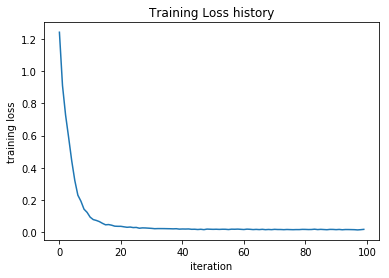

In [7]:
net = init_toy_model()
stats = net.train(X, y, X, y,
            learning_rate=1e-1, reg=5e-6,
            num_iters=100, verbose=True)

print('Final training loss: ', stats['loss_history'][-1])

# plot the loss history
plt.plot(stats['loss_history'])
plt.xlabel('iteration')
plt.ylabel('training loss')
plt.title('Training Loss history')
plt.show()

# Load the data
Now that you have implemented a two-layer network that passes gradient checks and works on toy data, it's time to load up our favorite CIFAR-10 data so we can use it to train a classifier on a real dataset.

In [8]:
from cs231n.data_utils import load_CIFAR10

def get_CIFAR10_data(num_training=49000, num_validation=1000, num_test=1000):
    """
    Load the CIFAR-10 dataset from disk and perform preprocessing to prepare
    it for the two-layer neural net classifier. These are the same steps as
    we used for the SVM, but condensed to a single function.  
    """
    # Load the raw CIFAR-10 data
    cifar10_dir = 'cs231n/datasets/cifar-10-batches-py'
    
    # Cleaning up variables to prevent loading data multiple times (which may cause memory issue)
    try:
       del X_train, y_train
       del X_test, y_test
       print('Clear previously loaded data.')
    except:
       pass

    X_train, y_train, X_test, y_test = load_CIFAR10(cifar10_dir)
        
    # Subsample the data
    mask = list(range(num_training, num_training + num_validation))
    X_val = X_train[mask]
    y_val = y_train[mask]
    mask = list(range(num_training))
    X_train = X_train[mask]
    y_train = y_train[mask]
    mask = list(range(num_test))
    X_test = X_test[mask]
    y_test = y_test[mask]

    # Normalize the data: subtract the mean image
    mean_image = np.mean(X_train, axis=0)
    X_train -= mean_image
    X_val -= mean_image
    X_test -= mean_image

    # Reshape data to rows
    X_train = X_train.reshape(num_training, -1)
    X_val = X_val.reshape(num_validation, -1)
    X_test = X_test.reshape(num_test, -1)

    return X_train, y_train, X_val, y_val, X_test, y_test


# Invoke the above function to get our data.
X_train, y_train, X_val, y_val, X_test, y_test = get_CIFAR10_data()
print('Train data shape: ', X_train.shape)
print('Train labels shape: ', y_train.shape)
print('Validation data shape: ', X_val.shape)
print('Validation labels shape: ', y_val.shape)
print('Test data shape: ', X_test.shape)
print('Test labels shape: ', y_test.shape)

Train data shape:  (49000, 3072)
Train labels shape:  (49000,)
Validation data shape:  (1000, 3072)
Validation labels shape:  (1000,)
Test data shape:  (1000, 3072)
Test labels shape:  (1000,)


# Train a network
To train our network we will use SGD. In addition, we will adjust the learning rate with an exponential learning rate schedule as optimization proceeds; after each epoch, we will reduce the learning rate by multiplying it by a decay rate.

In [11]:
input_size = 32 * 32 * 3
hidden_size = 50
num_classes = 10
net = TwoLayerNet(input_size, hidden_size, num_classes)

# Train the network
stats = net.train(X_train, y_train, X_val, y_val,
            num_iters=1000, batch_size=200,
            learning_rate=1e-4, learning_rate_decay=0.95,
            reg=0.25, verbose=True)

# Predict on the validation set
val_acc = (net.predict(X_val) == y_val).mean()
print('Validation accuracy: ', val_acc)


scores bef labelling
[[0.09999159 0.09998548 0.10002157 ... 0.1000268  0.10001755 0.10002083]
 [0.09998083 0.1000126  0.10000441 ... 0.1000089  0.09999967 0.10000331]
 [0.09997858 0.10001879 0.10001561 ... 0.10000067 0.09999964 0.09999673]
 ...
 [0.09999343 0.10001048 0.09999984 ... 0.1000021  0.10000603 0.09999426]
 [0.09999777 0.1000062  0.10000945 ... 0.10001392 0.10000227 0.10000186]
 [0.09999324 0.0999974  0.1000144  ... 0.09998801 0.10002718 0.09999101]]
scores aft labelling
[[ 0.09999159  0.09998548  0.10002157 ...  0.1000268  -0.89998245
   0.10002083]
 [ 0.09998083  0.1000126   0.10000441 ...  0.1000089   0.09999967
   0.10000331]
 [ 0.09997858 -0.89998121  0.10001561 ...  0.10000067  0.09999964
   0.09999673]
 ...
 [ 0.09999343  0.10001048  0.09999984 ...  0.1000021   0.10000603
   0.09999426]
 [ 0.09999777  0.1000062   0.10000945 ...  0.10001392 -0.89999773
   0.10000186]
 [ 0.09999324 -0.9000026   0.1000144  ...  0.09998801  0.10002718
   0.09999101]]
normalize s
[[ 0.00049

scores bef labelling
[[0.09998353 0.1000286  0.09999761 ... 0.10000106 0.10003443 0.10000196]
 [0.099969   0.10000558 0.10004626 ... 0.0999753  0.10006479 0.10001031]
 [0.09998293 0.10003246 0.10000784 ... 0.10000729 0.1000004  0.09999268]
 ...
 [0.09995418 0.10001352 0.0999935  ... 0.10002953 0.09998944 0.10001297]
 [0.09998866 0.1000177  0.10001307 ... 0.10000486 0.10002838 0.10000082]
 [0.09999121 0.10002512 0.1000247  ... 0.09998704 0.10003189 0.09999941]]
scores aft labelling
[[ 0.09998353  0.1000286   0.09999761 ...  0.10000106  0.10003443
   0.10000196]
 [ 0.099969    0.10000558  0.10004626 ...  0.0999753   0.10006479
  -0.89998969]
 [ 0.09998293 -0.89996754  0.10000784 ...  0.10000729  0.1000004
   0.09999268]
 ...
 [ 0.09995418  0.10001352  0.0999935  ...  0.10002953  0.09998944
   0.10001297]
 [ 0.09998866  0.1000177   0.10001307 ...  0.10000486 -0.89997162
   0.10000082]
 [ 0.09999121  0.10002512 -0.8999753  ...  0.09998704  0.10003189
   0.09999941]]
normalize s
[[ 0.000499

scores bef labelling
[[0.09998729 0.10000535 0.10001192 ... 0.1000086  0.1000137  0.0999901 ]
 [0.09996479 0.10000023 0.10003335 ... 0.10001372 0.10002575 0.09998871]
 [0.09995624 0.10001171 0.10000225 ... 0.1000184  0.1000221  0.09998702]
 ...
 [0.09997547 0.10001144 0.10001012 ... 0.10001688 0.0999941  0.09999973]
 [0.09995461 0.10004314 0.10001443 ... 0.10003358 0.0999795  0.09999036]
 [0.09997642 0.10000296 0.10001249 ... 0.1000101  0.10002532 0.09998285]]
scores aft labelling
[[ 0.09998729  0.10000535  0.10001192 ... -0.8999914   0.1000137
   0.0999901 ]
 [ 0.09996479  0.10000023  0.10003335 ...  0.10001372  0.10002575
   0.09998871]
 [ 0.09995624  0.10001171  0.10000225 ...  0.1000184   0.1000221
   0.09998702]
 ...
 [ 0.09997547  0.10001144  0.10001012 ...  0.10001688  0.0999941
   0.09999973]
 [ 0.09995461  0.10004314  0.10001443 ... -0.89996642  0.0999795
   0.09999036]
 [ 0.09997642 -0.89999704  0.10001249 ...  0.1000101   0.10002532
   0.09998285]]
normalize s
[[ 0.00049994 

scores bef labelling
[[0.09999219 0.10000019 0.10000117 ... 0.10000292 0.10000506 0.09999937]
 [0.09994718 0.10000805 0.09999424 ... 0.10002997 0.09998797 0.09997992]
 [0.09995801 0.10000701 0.10001764 ... 0.10003711 0.10000248 0.10002191]
 ...
 [0.09998911 0.10001362 0.1000097  ... 0.10000947 0.10002416 0.09999209]
 [0.09997813 0.10001556 0.10002131 ... 0.10000638 0.10003169 0.10000731]
 [0.09999616 0.09999736 0.10001429 ... 0.10000967 0.10004207 0.09999657]]
scores aft labelling
[[ 0.09999219  0.10000019  0.10000117 ...  0.10000292  0.10000506
   0.09999937]
 [ 0.09994718  0.10000805  0.09999424 ...  0.10002997  0.09998797
   0.09997992]
 [ 0.09995801 -0.89999299  0.10001764 ...  0.10003711  0.10000248
   0.10002191]
 ...
 [ 0.09998911  0.10001362  0.1000097  ... -0.89999053  0.10002416
   0.09999209]
 [ 0.09997813  0.10001556  0.10002131 ... -0.89999362  0.10003169
   0.10000731]
 [ 0.09999616  0.09999736  0.10001429 ...  0.10000967  0.10004207
   0.09999657]]
normalize s
[[ 0.00049

[[ 1.35129506e-02 -1.55017102e-02  1.15916127e-02  8.68122474e-03
   1.90815870e-04 -1.92457847e-02 -6.63380715e-03 -8.60632845e-03
   7.55980300e-03  8.45122363e-03]
 [-5.65442878e-03 -2.10822222e-03  5.97855732e-03  2.27233181e-04
  -5.10910183e-03 -1.10103358e-02  4.53571361e-03 -6.37796992e-04
   7.57782514e-03  6.20055640e-03]
 [ 7.55754699e-03 -9.45440083e-04  3.00699673e-03  4.06638435e-03
   4.54403233e-03 -3.30792450e-03 -5.88387707e-03 -6.05674949e-03
  -4.87863410e-03  1.89766483e-03]
 [-8.55519069e-03 -6.37274168e-04  7.11256335e-03 -1.77827622e-03
   6.18352984e-03 -1.85833752e-02  4.50512991e-03 -1.01122881e-03
   8.16593591e-03  4.59818605e-03]
 [-6.42244585e-03 -4.30316835e-03  2.75841137e-03  4.85138855e-03
   4.00368357e-03  1.28622127e-03  1.38699931e-03 -3.70552305e-03
   3.08684237e-03 -2.94240920e-03]
 [-2.63449753e-02  1.52352871e-03 -1.60254978e-03 -7.13155513e-04
   7.87060098e-03 -1.47891365e-03  9.90900648e-03 -5.73677568e-03
   5.55196309e-03  1.10212707e-02

scores bef labelling
[[0.09997806 0.10004409 0.10000995 ... 0.1000038  0.09998379 0.09998324]
 [0.09999871 0.0999918  0.10000281 ... 0.1000038  0.10006703 0.10001517]
 [0.0999757  0.10000522 0.10000603 ... 0.10001045 0.10000343 0.09997756]
 ...
 [0.0999508  0.10000106 0.10003718 ... 0.10001759 0.10000962 0.09998993]
 [0.09995387 0.10001442 0.1000031  ... 0.10002641 0.09997497 0.09999927]
 [0.10001381 0.09999973 0.10004649 ... 0.10000532 0.10005289 0.10001987]]
scores aft labelling
[[ 0.09997806 -0.89995591  0.10000995 ...  0.1000038   0.09998379
   0.09998324]
 [ 0.09999871  0.0999918  -0.89999719 ...  0.1000038   0.10006703
   0.10001517]
 [ 0.0999757   0.10000522  0.10000603 ...  0.10001045  0.10000343
   0.09997756]
 ...
 [ 0.0999508   0.10000106  0.10003718 ...  0.10001759  0.10000962
   0.09998993]
 [ 0.09995387  0.10001442  0.1000031  ...  0.10002641  0.09997497
  -0.90000073]
 [ 0.10001381  0.09999973  0.10004649 ...  0.10000532  0.10005289
  -0.89998013]]
normalize s
[[ 0.00049

  -2.69114166e-02 -2.51997346e-02]]
scores bef labelling
[[0.10008022 0.09997848 0.1000108  ... 0.09995929 0.10010573 0.10001439]
 [0.10006382 0.10002057 0.10000559 ... 0.09996424 0.10008764 0.10004566]
 [0.10003198 0.09998883 0.10000736 ... 0.09997752 0.10004896 0.09999956]
 ...
 [0.10000454 0.10001249 0.10000254 ... 0.10002139 0.10001977 0.09999189]
 [0.09995791 0.10002421 0.09999972 ... 0.10001603 0.09999871 0.09998559]
 [0.09997143 0.10000117 0.10000289 ... 0.10001915 0.10000271 0.09999135]]
scores aft labelling
[[ 0.10008022  0.09997848  0.1000108  ... -0.90004071  0.10010573
   0.10001439]
 [ 0.10006382  0.10002057  0.10000559 ...  0.09996424  0.10008764
   0.10004566]
 [ 0.10003198  0.09998883  0.10000736 ...  0.09997752  0.10004896
   0.09999956]
 ...
 [ 0.10000454  0.10001249  0.10000254 ...  0.10002139  0.10001977
   0.09999189]
 [ 0.09995791  0.10002421 -0.90000028 ...  0.10001603  0.09999871
   0.09998559]
 [ 0.09997143  0.10000117  0.10000289 ...  0.10001915  0.10000271
  

scores bef labelling
[[0.10007489 0.10002426 0.09999751 ... 0.0999576  0.10012031 0.10005024]
 [0.10013367 0.09999339 0.10001805 ... 0.09993425 0.10018113 0.10005091]
 [0.09989484 0.1000318  0.10000958 ... 0.1000282  0.09996098 0.09993558]
 ...
 [0.10016261 0.09998971 0.10002602 ... 0.09992789 0.10022219 0.1000466 ]
 [0.09995555 0.10001266 0.09999704 ... 0.1000011  0.09998605 0.09993415]
 [0.09990173 0.100013   0.10001291 ... 0.10003119 0.0999723  0.09992687]]
scores aft labelling
[[ 0.10007489  0.10002426  0.09999751 ... -0.9000424   0.10012031
   0.10005024]
 [ 0.10013367 -0.90000661  0.10001805 ...  0.09993425  0.10018113
   0.10005091]
 [ 0.09989484  0.1000318   0.10000958 ...  0.1000282   0.09996098
  -0.90006442]
 ...
 [ 0.10016261  0.09998971  0.10002602 ...  0.09992789  0.10022219
   0.1000466 ]
 [ 0.09995555  0.10001266  0.09999704 ...  0.1000011   0.09998605
   0.09993415]
 [ 0.09990173  0.100013    0.10001291 ...  0.10003119  0.0999723
   0.09992687]]
normalize s
[[ 0.000500

scores bef labelling
[[0.10010953 0.10000944 0.09999696 ... 0.09996123 0.10015621 0.10006218]
 [0.10020204 0.1000289  0.10000403 ... 0.09989433 0.10020755 0.10005781]
 [0.09998569 0.10003391 0.10000576 ... 0.10002122 0.1000284  0.10002339]
 ...
 [0.1002402  0.10001392 0.10001165 ... 0.09987964 0.10024993 0.10004083]
 [0.0998766  0.10002729 0.10001628 ... 0.10001022 0.09994704 0.09990055]
 [0.10007258 0.10001424 0.10002016 ... 0.09996288 0.10008838 0.09998586]]
scores aft labelling
[[ 0.10010953  0.10000944  0.09999696 ...  0.09996123 -0.89984379
   0.10006218]
 [ 0.10020204  0.1000289   0.10000403 ...  0.09989433 -0.89979245
   0.10005781]
 [ 0.09998569  0.10003391  0.10000576 ...  0.10002122  0.1000284
   0.10002339]
 ...
 [-0.8997598   0.10001392  0.10001165 ...  0.09987964  0.10024993
   0.10004083]
 [ 0.0998766   0.10002729  0.10001628 ... -0.89998978  0.09994704
   0.09990055]
 [-0.89992742  0.10001424  0.10002016 ...  0.09996288  0.10008838
   0.09998586]]
normalize s
[[ 0.000500

scores bef labelling
[[0.10011438 0.10002625 0.10001046 ... 0.09993919 0.10015023 0.10001884]
 [0.09983034 0.10001258 0.10002656 ... 0.10003691 0.09992203 0.09990925]
 [0.09996311 0.10001012 0.10000686 ... 0.10002695 0.1000019  0.09999592]
 ...
 [0.10029487 0.09998224 0.10001345 ... 0.09988324 0.10028187 0.100064  ]
 [0.09998877 0.10001582 0.09999816 ... 0.09999594 0.09999494 0.09996656]
 [0.10010817 0.10002548 0.09998571 ... 0.09995561 0.10012285 0.10004739]]
scores aft labelling
[[-0.89988562  0.10002625  0.10001046 ...  0.09993919  0.10015023
   0.10001884]
 [ 0.09983034  0.10001258  0.10002656 ...  0.10003691  0.09992203
   0.09990925]
 [ 0.09996311 -0.89998988  0.10000686 ...  0.10002695  0.1000019
   0.09999592]
 ...
 [ 0.10029487  0.09998224  0.10001345 ...  0.09988324  0.10028187
   0.100064  ]
 [ 0.09998877  0.10001582  0.09999816 ...  0.09999594  0.09999494
  -0.90003344]
 [ 0.10010817  0.10002548  0.09998571 ...  0.09995561  0.10012285
   0.10004739]]
normalize s
[[-0.004499

  -2.60641934e-02 -8.96140579e-03]]
scores bef labelling
[[0.09986157 0.10002054 0.10003967 ... 0.10003278 0.09993879 0.09996906]
 [0.09991115 0.09998739 0.10001122 ... 0.10001607 0.09994911 0.09994201]
 [0.1001027  0.10001989 0.10001378 ... 0.09995848 0.10015396 0.10003632]
 ...
 [0.10025677 0.1000265  0.09999035 ... 0.09988976 0.10031662 0.10012099]
 [0.09989949 0.10003917 0.10001354 ... 0.10001165 0.09993544 0.09996075]
 [0.1000578  0.09999213 0.10000942 ... 0.09996823 0.10006918 0.10000166]]
scores aft labelling
[[ 0.09986157  0.10002054  0.10003967 ...  0.10003278  0.09993879
   0.09996906]
 [ 0.09991115  0.09998739  0.10001122 ...  0.10001607  0.09994911
   0.09994201]
 [ 0.1001027   0.10001989  0.10001378 ...  0.09995848  0.10015396
   0.10003632]
 ...
 [ 0.10025677  0.1000265   0.09999035 ...  0.09988976 -0.89968338
   0.10012099]
 [ 0.09989949 -0.89996083  0.10001354 ...  0.10001165  0.09993544
   0.09996075]
 [ 0.1000578   0.09999213  0.10000942 ...  0.09996823  0.10006918
  

[[ 9.55422701e-03 -6.47655098e-04  5.77702700e-03 -9.18677900e-03
  -4.87521212e-03 -6.63109510e-03 -2.07357950e-02 -9.75083884e-04
   1.24831057e-02  1.52372604e-02]
 [ 7.42994601e-03 -2.43394088e-03  8.17031127e-03 -8.80380963e-03
  -2.82600367e-03  1.04782782e-04 -1.81409124e-02 -3.01773082e-03
   9.77119329e-03  9.74616404e-03]
 [-1.39313096e-02 -2.67470410e-03  5.74794878e-04  1.05992611e-02
   9.06624125e-03  5.45276454e-03  6.59516773e-03  4.77687555e-03
  -7.50198819e-03 -1.29571032e-02]
 [-1.39288386e-02  4.61148620e-03  3.25896039e-03  9.41846946e-03
  -2.34636403e-03  3.32506920e-03  3.47601764e-03  2.42425521e-03
   2.24526346e-03 -1.24843190e-02]
 [-1.33749975e-02  1.85987980e-03  6.25824051e-03  1.33205139e-02
   6.93427655e-04  1.07249964e-02  1.09108343e-02 -5.14221603e-04
  -1.56076879e-02 -1.42709855e-02]
 [-2.79696500e-02  5.62002880e-03  5.81697699e-03  2.18984800e-02
  -3.78861523e-03  3.79743521e-03  8.15630138e-03  1.30692944e-02
  -2.07234118e-02 -5.87683971e-03

scores bef labelling
[[0.10062885 0.1000345  0.09994961 ... 0.09975029 0.10068291 0.1003031 ]
 [0.10033192 0.10001978 0.09995782 ... 0.09988481 0.10035825 0.10014938]
 [0.10043401 0.10004811 0.09995975 ... 0.09983825 0.10052264 0.10028793]
 ...
 [0.10059086 0.10006181 0.09995836 ... 0.09974699 0.10062634 0.10028512]
 [0.10040022 0.10009083 0.09996795 ... 0.09984322 0.10044055 0.10022629]
 [0.09993219 0.10004701 0.10001345 ... 0.10002886 0.09995457 0.10000304]]
scores aft labelling
[[ 0.10062885  0.1000345   0.09994961 ...  0.09975029  0.10068291
  -0.8996969 ]
 [ 0.10033192  0.10001978  0.09995782 ...  0.09988481 -0.89964175
   0.10014938]
 [ 0.10043401  0.10004811  0.09995975 ... -0.90016175  0.10052264
   0.10028793]
 ...
 [-0.89940914  0.10006181  0.09995836 ...  0.09974699  0.10062634
   0.10028512]
 [ 0.10040022  0.10009083  0.09996795 ...  0.09984322  0.10044055
  -0.89977371]
 [ 0.09993219  0.10004701  0.10001345 ... -0.89997114  0.09995457
   0.10000304]]
normalize s
[[ 0.00050

scores bef labelling
[[0.09990942 0.09999378 0.10000344 ... 0.10000841 0.09995345 0.09993097]
 [0.09994023 0.10004241 0.09999547 ... 0.09999802 0.09998468 0.09993839]
 [0.09972526 0.09999469 0.10004178 ... 0.10003369 0.09983949 0.09982596]
 ...
 [0.100303   0.10003222 0.09998369 ... 0.09987931 0.10028919 0.10007549]
 [0.10042631 0.10011493 0.09993882 ... 0.09982765 0.1005043  0.10031904]
 [0.09950566 0.10003035 0.10007685 ... 0.10007541 0.09968843 0.09969813]]
scores aft labelling
[[ 0.09990942  0.09999378  0.10000344 ...  0.10000841 -0.90004655
   0.09993097]
 [ 0.09994023 -0.89995759  0.09999547 ...  0.09999802  0.09998468
   0.09993839]
 [ 0.09972526  0.09999469  0.10004178 ...  0.10003369  0.09983949
   0.09982596]
 ...
 [ 0.100303    0.10003222  0.09998369 ...  0.09987931 -0.89971081
   0.10007549]
 [ 0.10042631  0.10011493  0.09993882 ...  0.09982765 -0.8994957
   0.10031904]
 [ 0.09950566  0.10003035  0.10007685 ...  0.10007541  0.09968843
   0.09969813]]
normalize s
[[ 0.000499

  -1.98225518e-02 -3.15281870e-02]]
scores bef labelling
[[0.10068697 0.10004872 0.0999432  ... 0.09973109 0.10065961 0.10028232]
 [0.0998971  0.10006228 0.10000936 ... 0.09999675 0.09999503 0.09988592]
 [0.09959255 0.09994546 0.1000394  ... 0.10006523 0.09974469 0.09969936]
 ...
 [0.10063119 0.10006466 0.09992035 ... 0.09975609 0.10066806 0.10027254]
 [0.09995238 0.09998971 0.10001848 ... 0.10000965 0.09998025 0.09997294]
 [0.09990162 0.10010019 0.099998   ... 0.1000395  0.09994939 0.10005012]]
scores aft labelling
[[ 0.10068697  0.10004872 -0.9000568  ...  0.09973109  0.10065961
   0.10028232]
 [ 0.0998971  -0.89993772  0.10000936 ...  0.09999675  0.09999503
   0.09988592]
 [ 0.09959255  0.09994546  0.1000394  ...  0.10006523  0.09974469
   0.09969936]
 ...
 [ 0.10063119  0.10006466  0.09992035 ...  0.09975609  0.10066806
   0.10027254]
 [-0.90004762  0.09998971  0.10001848 ...  0.10000965  0.09998025
   0.09997294]
 [ 0.09990162  0.10010019  0.099998   ...  0.1000395   0.09994939
  

scores aft labelling
[[ 0.09993152  0.10002223 -0.89999875 ...  0.10001474  0.09998563
   0.10001826]
 [ 0.09980148  0.10003625 -0.89997306 ...  0.09999993  0.09993927
   0.0998196 ]
 [ 0.09984053  0.09997785  0.10000734 ...  0.1000271   0.09988605
   0.09987695]
 ...
 [ 0.09971393  0.09999606 -0.89995107 ...  0.10003991  0.0997827
   0.09983956]
 [ 0.09982106  0.09998504  0.10002085 ...  0.10003807  0.09987656
   0.09989581]
 [ 0.0995629   0.10001731  0.10005481 ...  0.10008073  0.09969504
   0.09977212]]
normalize s
[[ 0.00049966  0.00050011 -0.00449999 ...  0.00050007  0.00049993
   0.00050009]
 [ 0.00049901  0.00050018 -0.00449987 ...  0.0005      0.0004997
   0.0004991 ]
 [ 0.0004992   0.00049989  0.00050004 ...  0.00050014  0.00049943
   0.00049938]
 ...
 [ 0.00049857  0.00049998 -0.00449976 ...  0.0005002   0.00049891
   0.0004992 ]
 [ 0.00049911  0.00049993  0.0005001  ...  0.00050019  0.00049938
   0.00049948]
 [ 0.00049781  0.00050009  0.00050027 ...  0.0005004   0.00049848
 

[[ 2.08192921e-02 -8.35727466e-03  8.81118919e-03 -3.43257124e-02
  -4.81756896e-04 -2.78752034e-02  1.60660347e-02  6.77834704e-03
   1.38308212e-02  4.73426303e-03]
 [ 8.14794350e-03 -4.35227951e-03  1.42929760e-02 -1.50563816e-02
  -1.85350678e-03 -1.60341726e-02  5.76048547e-03 -2.94134517e-04
   1.18363346e-02 -2.44726461e-03]
 [-4.54981668e-02  6.75563476e-03  2.86549017e-03  1.36102999e-02
   1.17567096e-02  1.20429660e-02  2.09702872e-02  1.42910150e-02
  -3.19972799e-02 -4.79695586e-03]
 [-3.50370684e-02  3.74558494e-03  8.21803450e-03  4.26047645e-03
   1.30353319e-02 -4.85458281e-03  2.00828506e-02  5.80757572e-03
  -2.39936025e-02  8.73539959e-03]
 [-3.11403164e-02  4.42868223e-03 -8.49485990e-03  1.05204875e-02
   1.27389561e-02  1.26558567e-02  1.85262392e-02  3.83221437e-03
  -2.20200840e-02 -1.04717574e-03]
 [-9.01668076e-02  2.18264491e-02  1.84105218e-03  2.91579175e-02
   2.04320260e-02  6.27823443e-03  4.16900962e-02  2.38676183e-02
  -7.78927171e-02  2.29661308e-02

[[ 5.26919209e-02  2.77882821e-02 -1.52257691e-02 -6.59462828e-02
  -3.41041623e-02  1.00259086e-02 -1.87786562e-02 -1.00587394e-02
   1.56374611e-02  3.79700370e-02]
 [ 2.82749250e-02  1.10575262e-02 -3.96303012e-03 -3.91672799e-02
  -1.65003616e-02  1.50704088e-03 -1.43645542e-02  5.57250249e-05
   1.39050874e-02  1.91949214e-02]
 [-1.43807101e-02 -9.01962927e-03  9.75915780e-03  1.46507348e-02
   2.10290118e-02  1.24086230e-02  1.76549895e-02  9.05506138e-03
  -2.89208916e-02 -3.22363473e-02]
 [-1.25476731e-02 -9.41486660e-03  2.07118894e-03  7.51615484e-03
   1.37564294e-02  3.90461289e-03  1.50941134e-02  4.43077863e-03
  -1.50394835e-02 -9.77125493e-03]
 [ 4.26110895e-03 -1.14763686e-02  6.22077355e-03  9.79996772e-03
   1.13781659e-02  1.04931664e-02  9.45257351e-03 -5.40122975e-03
  -1.43649104e-02 -2.03632473e-02]
 [-4.06958957e-02  6.03771001e-03 -4.88414775e-03  2.75683554e-02
   2.97177093e-02  1.67352406e-02  1.47101656e-02  1.64530124e-02
  -4.90345377e-02 -1.66076121e-02

[[ 2.99840257e-02  2.82544674e-02 -7.64017123e-03  1.90889590e-02
  -5.20200838e-02 -6.65824756e-02 -2.80447331e-02  1.74923641e-02
   3.00517384e-02  2.94159091e-02]
 [ 1.69894110e-02  1.09340859e-02 -1.48051515e-03  2.56122697e-03
  -2.05873488e-02 -3.04937929e-02 -1.90835524e-02  1.41365082e-02
   1.65326484e-02  1.04913289e-02]
 [-2.24420687e-02  1.17788865e-02  4.15326382e-03  6.50791519e-03
   1.89435166e-02  2.27713782e-02  1.22793096e-02 -1.15323845e-04
  -2.12627837e-02 -3.26140937e-02]
 [-2.65315092e-02  1.37682104e-02  2.48647236e-03 -7.02907120e-03
   1.15924377e-02  1.36889440e-02  8.71294195e-03  6.66480920e-03
  -1.32409403e-02 -1.01122949e-02]
 [-2.49366072e-03  6.08479803e-03 -4.76008268e-03  5.66298425e-03
   1.75049734e-02  2.08987293e-02  1.00045996e-02 -1.48305746e-02
  -1.55221021e-02 -2.25496646e-02]
 [-7.02048308e-02  2.43014367e-02  7.04313467e-03  2.53204134e-03
   3.27917658e-02  4.77742713e-02  2.30156503e-02  3.52070542e-03
  -2.59075484e-02 -4.48666262e-02

scores aft labelling
[[ 0.09971056 -0.89997538  0.1000307  ...  0.1000201   0.09978723
   0.09981768]
 [ 0.0990467   0.09993376  0.10009189 ...  0.10008375  0.0992656
   0.09931791]
 [ 0.10086524  0.10039559  0.09971044 ...  0.09967603 -0.89887838
   0.10083511]
 ...
 [ 0.10350738  0.10031507  0.09950539 ...  0.09873309 -0.89675932
   0.10143744]
 [ 0.10028493  0.10001163  0.09998037 ...  0.09991552  0.10021527
   0.1000847 ]
 [ 0.0995136  -0.90009214  0.10003415 ...  0.10006616  0.09963216
   0.09961737]]
normalize s
[[ 0.00049855 -0.00449988  0.00050015 ...  0.0005001   0.00049894
   0.00049909]
 [ 0.00049523  0.00049967  0.00050046 ...  0.00050042  0.00049633
   0.00049659]
 [ 0.00050433  0.00050198  0.00049855 ...  0.00049838 -0.00449439
   0.00050418]
 ...
 [ 0.00051754  0.00050158  0.00049753 ...  0.00049367 -0.0044838
   0.00050719]
 [ 0.00050142  0.00050006  0.0004999  ...  0.00049958  0.00050108
   0.00050042]
 [ 0.00049757 -0.00450046  0.00050017 ...  0.00050033  0.00049816
 

iteration 200 / 1000: loss 2.297939
scores bef labelling
[[0.0992697  0.09995594 0.10005851 ... 0.10004992 0.09948305 0.0994068 ]
 [0.09974956 0.09991874 0.10001577 ... 0.09996259 0.09985404 0.09960944]
 [0.1038437  0.10022848 0.09953466 ... 0.09867096 0.10361538 0.10156071]
 ...
 [0.10255929 0.1001409  0.09972538 ... 0.09910231 0.10236518 0.10092393]
 [0.10104632 0.100076   0.09987697 ... 0.09964032 0.10095883 0.10042959]
 [0.10069148 0.10020221 0.09978156 ... 0.09982338 0.10091943 0.1008054 ]]
scores aft labelling
[[ 0.0992697   0.09995594  0.10005851 ...  0.10004992  0.09948305
   0.0994068 ]
 [ 0.09974956  0.09991874  0.10001577 ...  0.09996259 -0.90014596
   0.09960944]
 [ 0.1038437   0.10022848 -0.90046534 ...  0.09867096  0.10361538
   0.10156071]
 ...
 [-0.89744071  0.1001409   0.09972538 ...  0.09910231  0.10236518
   0.10092393]
 [ 0.10104632  0.100076    0.09987697 ...  0.09964032  0.10095883
   0.10042959]
 [ 0.10069148  0.10020221  0.09978156 ... -0.90017662  0.10091943
  

   0.09902161]]
normalize s
[[-0.00447677  0.0005014   0.00049762 ...  0.00049164  0.00052212
   0.00050876]
 [ 0.00049597  0.00049971  0.0005004  ...  0.00050018  0.0004969
   0.00049686]
 [ 0.00049463  0.00049955  0.00050054 ...  0.00050035  0.0004956
   0.00049583]
 ...
 [ 0.00050615 -0.00449943  0.0004994  ...  0.00049775  0.0005062
   0.00050232]
 [ 0.00049674  0.00049955  0.00050031 ...  0.00050015  0.00049749
   0.0004972 ]
 [ 0.00049396  0.00049974  0.00050064 ...  0.00050019 -0.00450472
   0.00049511]]
H1
[[0.         0.         1.23010054 ... 1.59515933 0.         4.88677863]
 [1.58612913 0.71305161 0.         ... 0.         1.21120843 0.        ]
 [2.03703194 0.80937458 0.         ... 0.         2.41179185 0.        ]
 ...
 [0.         0.         0.76515631 ... 0.         0.         1.45532094]
 [1.28892783 0.42203424 0.         ... 0.         0.83638096 0.        ]
 [2.93063773 1.16628357 0.         ... 0.         2.01468981 0.        ]]
dW2
[[ 3.72141541e-02 -1.97452269e-0

scores bef labelling
[[0.09926294 0.09994282 0.1000968  ... 0.10004466 0.09938835 0.09943923]
 [0.10141615 0.10008526 0.09986003 ... 0.09952828 0.10144413 0.10064344]
 [0.09779959 0.09982309 0.10030836 ... 0.10010593 0.09822466 0.09833316]
 ...
 [0.10312325 0.10051919 0.09938392 ... 0.09894372 0.10375348 0.10215985]
 [0.09885354 0.09993616 0.10014684 ... 0.10004933 0.09908592 0.09911297]
 [0.10039279 0.10022722 0.09983746 ... 0.09988326 0.10069991 0.10058888]]
scores aft labelling
[[ 0.09926294  0.09994282  0.1000968  ...  0.10004466  0.09938835
   0.09943923]
 [ 0.10141615  0.10008526  0.09986003 ...  0.09952828  0.10144413
   0.10064344]
 [ 0.09779959  0.09982309  0.10030836 ...  0.10010593  0.09822466
   0.09833316]
 ...
 [ 0.10312325  0.10051919  0.09938392 ...  0.09894372  0.10375348
  -0.89784015]
 [-0.90114646  0.09993616  0.10014684 ...  0.10004933  0.09908592
   0.09911297]
 [ 0.10039279  0.10022722  0.09983746 ...  0.09988326  0.10069991
  -0.89941112]]
normalize s
[[ 0.00049

scores bef labelling
[[0.09818986 0.09988598 0.10022438 ... 0.10009876 0.09851878 0.09866472]
 [0.09988507 0.09999847 0.10001094 ... 0.10001288 0.09991724 0.0999143 ]
 [0.09946408 0.09996925 0.10007326 ... 0.10005116 0.09952424 0.09960494]
 ...
 [0.09913774 0.09985714 0.10008499 ... 0.10006455 0.09930225 0.09927085]
 [0.09932184 0.09992664 0.10009056 ... 0.10005623 0.09941914 0.0995063 ]
 [0.09911301 0.09989276 0.10012224 ... 0.10006249 0.09927462 0.09932054]]
scores aft labelling
[[ 0.09818986  0.09988598  0.10022438 ...  0.10009876  0.09851878
  -0.90133528]
 [-0.90011493  0.09999847  0.10001094 ...  0.10001288  0.09991724
   0.0999143 ]
 [ 0.09946408  0.09996925  0.10007326 ...  0.10005116  0.09952424
   0.09960494]
 ...
 [ 0.09913774  0.09985714 -0.89991501 ...  0.10006455  0.09930225
   0.09927085]
 [ 0.09932184  0.09992664  0.10009056 ...  0.10005623  0.09941914
   0.0995063 ]
 [ 0.09911301  0.09989276  0.10012224 ...  0.10006249  0.09927462
   0.09932054]]
normalize s
[[ 0.00049

scores bef labelling
[[0.09741835 0.09970507 0.10020468 ... 0.10018104 0.09783402 0.09784408]
 [0.09915578 0.09997486 0.10008206 ... 0.10006255 0.09930133 0.0993809 ]
 [0.1038357  0.10001564 0.09959476 ... 0.09873449 0.10374573 0.10132492]
 ...
 [0.09891028 0.09986979 0.10012037 ... 0.10009205 0.09907755 0.09915759]
 [0.09977774 0.09998771 0.10002291 ... 0.10000825 0.09982749 0.09982756]
 [0.09633177 0.0995879  0.10037893 ... 0.10022476 0.09692609 0.09708512]]
scores aft labelling
[[ 0.09741835  0.09970507  0.10020468 ...  0.10018104  0.09783402
   0.09784408]
 [ 0.09915578  0.09997486  0.10008206 ...  0.10006255 -0.90069867
   0.0993809 ]
 [ 0.1038357   0.10001564  0.09959476 ...  0.09873449  0.10374573
   0.10132492]
 ...
 [ 0.09891028  0.09986979  0.10012037 ... -0.89990795  0.09907755
   0.09915759]
 [ 0.09977774  0.09998771 -0.89997709 ...  0.10000825  0.09982749
   0.09982756]
 [ 0.09633177  0.0995879   0.10037893 ...  0.10022476  0.09692609
   0.09708512]]
normalize s
[[ 0.00048

scores aft labelling
[[ 0.10252205  0.10033718  0.09941714 ...  0.09919845  0.10300854
   0.10177506]
 [ 0.10269164  0.10011218 -0.90040658 ...  0.09911649  0.10276553
   0.1011977 ]
 [ 0.1007938   0.10020907  0.09978365 ...  0.09976067  0.10098914
  -0.89934282]
 ...
 [ 0.12137162  0.10066106  0.09590528 ...  0.09278879  0.12319668
   0.10990788]
 [ 0.10252302  0.10014905  0.09960594 ...  0.09915087  0.10264155
  -0.89887317]
 [ 0.09996108  0.10000752  0.10000551 ...  0.10000075  0.09996868
  -0.89999969]]
normalize s
[[ 0.00051261  0.00050169  0.00049709 ...  0.00049599  0.00051504
   0.00050888]
 [ 0.00051346  0.00050056 -0.00450203 ...  0.00049558  0.00051383
   0.00050599]
 [ 0.00050397  0.00050105  0.00049892 ...  0.0004988   0.00050495
  -0.00449671]
 ...
 [ 0.00060686  0.00050331  0.00047953 ...  0.00046394  0.00061598
   0.00054954]
 [ 0.00051262  0.00050075  0.00049803 ...  0.00049575  0.00051321
  -0.00449437]
 [ 0.00049981  0.00050004  0.00050003 ...  0.0005      0.00049984

scores bef labelling
[[0.10364103 0.10039529 0.09928613 ... 0.09874394 0.10437249 0.1021062 ]
 [0.0997044  0.10000214 0.10008212 ... 0.10001785 0.09976519 0.09986308]
 [0.09954709 0.09993624 0.1000639  ... 0.10003242 0.09961491 0.09963843]
 ...
 [0.0968661  0.0996131  0.10043717 ... 0.1001432  0.0972876  0.09736041]
 [0.09858162 0.09991816 0.10019786 ... 0.1000595  0.09879429 0.09891948]
 [0.11995711 0.10104378 0.09617196 ... 0.09286628 0.12316959 0.10903599]]
scores aft labelling
[[ 0.10364103  0.10039529  0.09928613 ... -0.90125606  0.10437249
   0.1021062 ]
 [ 0.0997044   0.10000214  0.10008212 ...  0.10001785  0.09976519
  -0.90013692]
 [ 0.09954709  0.09993624  0.1000639  ...  0.10003242  0.09961491
   0.09963843]
 ...
 [ 0.0968661   0.0996131   0.10043717 ...  0.1001432   0.0972876
   0.09736041]
 [ 0.09858162 -0.90008184  0.10019786 ...  0.1000595   0.09879429
   0.09891948]
 [ 0.11995711  0.10104378  0.09617196 ...  0.09286628  0.12316959
  -0.89096401]]
normalize s
[[ 0.000518

[[0.12093079 0.10025988 0.09649919 ... 0.09291053 0.1220013  0.10693443]
 [0.1097852  0.1002055  0.09852659 ... 0.09672786 0.11017242 0.10335218]
 [0.10227863 0.10042325 0.09936061 ... 0.09929551 0.10299424 0.10172311]
 ...
 [0.11350994 0.1011372  0.09703055 ... 0.09532247 0.11589085 0.10663028]
 [0.09623084 0.0993367  0.10051851 ... 0.10019649 0.09666337 0.0967077 ]
 [0.09814051 0.09965848 0.10027653 ... 0.10011938 0.09833226 0.09839287]]
scores aft labelling
[[-0.87906921  0.10025988  0.09649919 ...  0.09291053  0.1220013
   0.10693443]
 [ 0.1097852   0.1002055   0.09852659 ...  0.09672786 -0.88982758
   0.10335218]
 [ 0.10227863  0.10042325  0.09936061 ...  0.09929551  0.10299424
   0.10172311]
 ...
 [ 0.11350994  0.1011372   0.09703055 ...  0.09532247  0.11589085
  -0.89336972]
 [ 0.09623084  0.0993367   0.10051851 ...  0.10019649  0.09666337
   0.0967077 ]
 [ 0.09814051  0.09965848  0.10027653 ... -0.89988062  0.09833226
   0.09839287]]
normalize s
[[-0.00439535  0.0005013   0.000

[[ 3.36615705  1.74748625  0.         ...  0.          3.89992838
   0.        ]
 [ 0.          0.          1.14429964 ...  1.46325254  0.
   6.87080891]
 [ 1.47443054  0.43139463  0.         ...  0.          0.91180115
   0.        ]
 ...
 [ 0.          0.          3.9588594  ...  6.67564987  0.
  16.00681761]
 [ 0.          0.2550664   0.         ...  0.          0.
   1.62511301]
 [ 0.          0.          0.         ...  1.32832012  0.
   0.73696576]]
dW2
[[ 9.39555137e-02 -8.91662537e-02 -2.23888817e-02 -2.96601366e-02
   2.02659489e-02  9.18352671e-03 -1.20313350e-01  5.30430593e-02
   3.90714577e-02  4.60091157e-02]
 [ 5.08455085e-02 -4.76011503e-02 -9.76763751e-03 -1.94247655e-02
   7.78134754e-03  5.50935765e-03 -6.07546555e-02  2.98217884e-02
   1.86617113e-02  2.49284953e-02]
 [-8.56553347e-02  2.88091021e-02  3.73649798e-03  1.72896756e-02
   3.66667251e-02  2.01926152e-02  6.32538776e-02  4.01669164e-02
  -1.14998495e-01 -9.46157990e-03]
 [-1.02151314e-01  2.84057583e-02 -

[[ 8.03721125e-02 -4.11999748e-03 -3.73374186e-02  7.18710334e-03
  -5.03886378e-02 -5.20797691e-02 -1.58328044e-01  1.38447406e-03
   1.06703873e-01  1.06606305e-01]
 [ 4.48997183e-02 -8.72415046e-03 -7.84571990e-03 -1.15491050e-03
  -2.40973210e-02 -2.52361885e-02 -9.02438561e-02 -2.92705159e-03
   6.18373120e-02  5.34921678e-02]
 [-4.51780394e-02  1.67411203e-02  5.84121091e-04  4.98402614e-02
   4.93326396e-02  6.83646740e-02  6.13394241e-02  3.42448750e-02
  -1.56580896e-01 -7.86881803e-02]
 [-5.09778965e-02  3.21213938e-02 -3.76546484e-03  2.31840043e-02
   3.18987992e-02  3.62090299e-02  4.37394402e-02  1.61360142e-03
  -9.89689191e-02 -1.50539884e-02]
 [-6.57882043e-03  8.53876437e-03  9.32482426e-03  2.79187277e-02
   2.62451507e-02  4.81022354e-02  3.26103735e-02 -5.34492758e-05
  -7.15215782e-02 -7.45862280e-02]
 [-1.34842325e-01  5.64637866e-02 -3.56922884e-02  7.63878156e-02
   8.12470108e-02  1.05671614e-01  1.08380580e-01  5.01136889e-02
  -2.69111749e-01 -3.86181335e-02

scores bef labelling
[[0.10081347 0.10014516 0.09981187 ... 0.09976826 0.10094472 0.10054997]
 [0.11928093 0.10096848 0.09621041 ... 0.09351179 0.12073279 0.1076962 ]
 [0.12490863 0.1010612  0.09497464 ... 0.09155892 0.12686132 0.1095047 ]
 ...
 [0.10875762 0.10038357 0.09861526 ... 0.09707563 0.10885362 0.10301979]
 [0.09689363 0.09933588 0.10043926 ... 0.10004622 0.09718512 0.09713706]
 [0.16175748 0.0984251  0.08720689 ... 0.07971687 0.16403616 0.11734595]]
scores aft labelling
[[ 0.10081347  0.10014516  0.09981187 ...  0.09976826  0.10094472
  -0.89945003]
 [ 0.11928093  0.10096848  0.09621041 ...  0.09351179 -0.87926721
   0.1076962 ]
 [ 0.12490863  0.1010612   0.09497464 ...  0.09155892 -0.87313868
   0.1095047 ]
 ...
 [-0.89124238  0.10038357  0.09861526 ...  0.09707563  0.10885362
   0.10301979]
 [ 0.09689363  0.09933588  0.10043926 ...  0.10004622  0.09718512
   0.09713706]
 [-0.83824252  0.0984251   0.08720689 ...  0.07971687  0.16403616
   0.11734595]]
normalize s
[[ 0.00050

scores bef labelling
[[0.12201774 0.10145341 0.09492399 ... 0.09252258 0.12562144 0.11027179]
 [0.09684858 0.09954447 0.10054609 ... 0.10006218 0.09712972 0.09726977]
 [0.09579498 0.09926634 0.10075342 ... 0.10012806 0.0961433  0.0963675 ]
 ...
 [0.09515    0.09925719 0.10083101 ... 0.10012562 0.09560912 0.09591406]
 [0.16012002 0.09840045 0.08720073 ... 0.08036005 0.16436512 0.11761134]
 [0.13050148 0.10050817 0.0940236  ... 0.08994365 0.13279042 0.1105505 ]]
scores aft labelling
[[ 0.12201774  0.10145341  0.09492399 ...  0.09252258  0.12562144
  -0.88972821]
 [-0.90315142  0.09954447  0.10054609 ...  0.10006218  0.09712972
   0.09726977]
 [ 0.09579498  0.09926634  0.10075342 ...  0.10012806  0.0961433
   0.0963675 ]
 ...
 [ 0.09515     0.09925719  0.10083101 ...  0.10012562  0.09560912
  -0.90408594]
 [-0.83987998  0.09840045  0.08720073 ...  0.08036005  0.16436512
   0.11761134]
 [ 0.13050148  0.10050817  0.0940236  ...  0.08994365 -0.86720958
   0.1105505 ]]
normalize s
[[ 0.000610

[[ 7.90979374e-02  1.40315133e-02  6.96389091e-02  5.30355720e-05
  -3.10055480e-01  5.02433715e-02 -1.39113381e-01  5.71560741e-02
   6.89770849e-02  1.09970935e-01]
 [ 4.95918209e-02  7.92230143e-03  4.18190606e-02 -5.52491258e-03
  -1.67716002e-01  2.07465395e-02 -9.23976488e-02  4.03764812e-02
   4.70775036e-02  5.81048561e-02]
 [-8.22345442e-02 -7.01285619e-02  3.25603118e-02  4.30120700e-02
   9.90891637e-02 -1.98924790e-02  3.93445676e-02 -1.07597190e-03
  -5.91910681e-02  1.85165120e-02]
 [-5.93515736e-02 -3.50015564e-02  1.31952767e-02  2.08162581e-02
   6.68401363e-02 -4.31034289e-02  6.56719896e-03  1.70598498e-02
  -1.84327260e-02  3.14105650e-02]
 [-2.50940112e-02 -4.13492388e-02  2.38970228e-02  1.98134550e-02
   4.95782497e-02  3.61751303e-03  3.46249801e-02 -8.84100339e-03
  -3.59928767e-02 -2.02540905e-02]
 [-1.74659784e-01 -9.40133388e-02  2.71381709e-02  6.26357885e-02
   1.76843945e-01 -9.72458489e-02  3.48694205e-02  3.32243649e-02
  -5.83882648e-02  8.95955471e-02

[[0.09640836 0.09927102 0.10061316 ... 0.10012193 0.09668831 0.09677363]
 [0.16657995 0.09709288 0.08570089 ... 0.07821211 0.1737832  0.1204885 ]
 [0.09434763 0.09881912 0.10091657 ... 0.10015598 0.09477182 0.09491341]
 ...
 [0.12753058 0.10069098 0.09439966 ... 0.0910975  0.1308491  0.11189198]
 [0.09758582 0.09971589 0.10035802 ... 0.10000769 0.09800583 0.09808325]
 [0.09771396 0.09943052 0.10038131 ... 0.10005364 0.09790938 0.09769934]]
scores aft labelling
[[ 0.09640836  0.09927102  0.10061316 ... -0.89987807  0.09668831
   0.09677363]
 [ 0.16657995  0.09709288  0.08570089 ...  0.07821211 -0.8262168
   0.1204885 ]
 [ 0.09434763  0.09881912  0.10091657 ...  0.10015598  0.09477182
   0.09491341]
 ...
 [ 0.12753058  0.10069098  0.09439966 ... -0.9089025   0.1308491
   0.11189198]
 [ 0.09758582 -0.90028411  0.10035802 ...  0.10000769  0.09800583
   0.09808325]
 [ 0.09771396  0.09943052  0.10038131 ... -0.89994636  0.09790938
   0.09769934]]
normalize s
[[ 0.00048204  0.00049636  0.0005

scores bef labelling
[[0.09257312 0.09857502 0.10106286 ... 0.1000948  0.09317403 0.09332078]
 [0.08375181 0.09632976 0.10214223 ... 0.09997196 0.08491964 0.08543521]
 [0.1019818  0.10085586 0.09902619 ... 0.09853468 0.10400801 0.10158418]
 ...
 [0.09664717 0.09975513 0.10043099 ... 0.10009965 0.09714134 0.09765229]
 [0.10709708 0.10045445 0.0987892  ... 0.09775926 0.1077017  0.10298809]
 [0.08553873 0.09702405 0.10196836 ... 0.0999414  0.0866757  0.08715604]]
scores aft labelling
[[ 0.09257312 -0.90142498  0.10106286 ...  0.1000948   0.09317403
   0.09332078]
 [ 0.08375181  0.09632976  0.10214223 ...  0.09997196  0.08491964
   0.08543521]
 [ 0.1019818  -0.89914414  0.09902619 ...  0.09853468  0.10400801
   0.10158418]
 ...
 [ 0.09664717 -0.90024487  0.10043099 ...  0.10009965  0.09714134
   0.09765229]
 [-0.89290292  0.10045445  0.0987892  ...  0.09775926  0.1077017
   0.10298809]
 [ 0.08553873  0.09702405  0.10196836 ...  0.0999414   0.0866757
   0.08715604]]
normalize s
[[ 0.0004628

scores bef labelling
[[0.09951395 0.09997963 0.10007225 ... 0.10011533 0.09959815 0.09983302]
 [0.09407566 0.09884805 0.10083518 ... 0.10012527 0.09448803 0.09454167]
 [0.13331601 0.10095656 0.09240089 ... 0.08968736 0.13607983 0.11482951]
 ...
 [0.16967675 0.09920786 0.08002525 ... 0.07646867 0.18386263 0.13166853]
 [0.19979314 0.09391282 0.07228769 ... 0.06682223 0.21559958 0.13468518]
 [0.11344103 0.10109124 0.0969142  ... 0.09577554 0.11506761 0.10696769]]
scores aft labelling
[[ 0.09951395  0.09997963  0.10007225 ...  0.10011533  0.09959815
   0.09983302]
 [ 0.09407566  0.09884805  0.10083518 ...  0.10012527  0.09448803
   0.09454167]
 [ 0.13331601  0.10095656  0.09240089 ...  0.08968736  0.13607983
   0.11482951]
 ...
 [ 0.16967675 -0.90079214  0.08002525 ...  0.07646867  0.18386263
   0.13166853]
 [ 0.19979314  0.09391282  0.07228769 ...  0.06682223  0.21559958
  -0.86531482]
 [ 0.11344103  0.10109124  0.0969142  ...  0.09577554  0.11506761
   0.10696769]]
normalize s
[[ 0.00049

scores bef labelling
[[0.08894896 0.09777312 0.10151575 ... 0.10016593 0.08963242 0.0896011 ]
 [0.08546774 0.09674405 0.10182453 ... 0.10019798 0.08628298 0.08619867]
 [0.26225743 0.08027656 0.05488911 ... 0.04803107 0.27227421 0.14144701]
 ...
 [0.13555851 0.10103227 0.09213716 ... 0.0889651  0.1365568  0.1157494 ]
 [0.09971558 0.10011642 0.09993286 ... 0.10007455 0.0999455  0.10020907]
 [0.08006438 0.09542377 0.10235486 ... 0.09993668 0.08108739 0.08129453]]
scores aft labelling
[[ 0.08894896  0.09777312  0.10151575 ...  0.10016593  0.08963242
   0.0896011 ]
 [ 0.08546774  0.09674405  0.10182453 ...  0.10019798  0.08628298
   0.08619867]
 [ 0.26225743  0.08027656  0.05488911 ...  0.04803107 -0.72772579
   0.14144701]
 ...
 [ 0.13555851  0.10103227  0.09213716 ...  0.0889651   0.1365568
  -0.8842506 ]
 [ 0.09971558  0.10011642  0.09993286 ...  0.10007455  0.0999455
   0.10020907]
 [ 0.08006438  0.09542377  0.10235486 ... -0.90006332  0.08108739
   0.08129453]]
normalize s
[[ 0.0004447

scores bef labelling
[[0.14548507 0.10079908 0.08795684 ... 0.08569237 0.14994582 0.12483703]
 [0.07750637 0.09407107 0.10212637 ... 0.09925807 0.07849638 0.07856297]
 [0.18716166 0.09433285 0.08090546 ... 0.07431371 0.1817572  0.12718609]
 ...
 [0.08035197 0.09518698 0.10204665 ... 0.09956298 0.08118209 0.08145487]
 [0.12162468 0.09902468 0.09750161 ... 0.09421897 0.11727041 0.1052931 ]
 [0.09919235 0.10034965 0.0996576  ... 0.09991263 0.10003395 0.1003499 ]]
scores aft labelling
[[ 0.14548507  0.10079908  0.08795684 ...  0.08569237  0.14994582
  -0.87516297]
 [ 0.07750637  0.09407107  0.10212637 ...  0.09925807  0.07849638
   0.07856297]
 [ 0.18716166  0.09433285  0.08090546 ...  0.07431371  0.1817572
  -0.87281391]
 ...
 [ 0.08035197  0.09518698  0.10204665 ...  0.09956298  0.08118209
   0.08145487]
 [ 0.12162468  0.09902468  0.09750161 ...  0.09421897  0.11727041
   0.1052931 ]
 [ 0.09919235  0.10034965  0.0996576  ...  0.09991263  0.10003395
   0.1003499 ]]
normalize s
[[ 0.000727

scores bef labelling
[[0.1180203  0.09883554 0.09847484 ... 0.09545326 0.11314081 0.10324147]
 [0.1466902  0.10184392 0.0863937  ... 0.08465848 0.15370882 0.12995922]
 [0.10196263 0.09979039 0.09989421 ... 0.09938953 0.10146039 0.09989907]
 ...
 [0.11368946 0.09944999 0.09865086 ... 0.09640459 0.11050113 0.10318558]
 [0.25088597 0.0831114  0.06286396 ... 0.05524456 0.23938101 0.14027998]
 [0.08441174 0.09627064 0.10204353 ... 0.09947801 0.08506592 0.08533356]]
scores aft labelling
[[ 0.1180203   0.09883554  0.09847484 ... -0.90454674  0.11314081
   0.10324147]
 [ 0.1466902   0.10184392  0.0863937  ...  0.08465848  0.15370882
  -0.87004078]
 [ 0.10196263  0.09979039  0.09989421 ...  0.09938953  0.10146039
  -0.90010093]
 ...
 [ 0.11368946  0.09944999 -0.90134914 ...  0.09640459  0.11050113
   0.10318558]
 [-0.74911403  0.0831114   0.06286396 ...  0.05524456  0.23938101
   0.14027998]
 [ 0.08441174  0.09627064  0.10204353 ...  0.09947801  0.08506592
   0.08533356]]
normalize s
[[ 0.00059

scores aft labelling
[[ 0.08691612  0.09707835  0.1016815  ...  0.09978786  0.08736205
   0.08767269]
 [ 0.10083642  0.09981773  0.10003768 ...  0.09985378  0.10049318
   0.09992506]
 [ 0.09605613  0.09921208  0.10063178 ... -0.89981822  0.09616922
   0.09654396]
 ...
 [-0.78435192  0.09106426  0.07564675 ...  0.06680919  0.19719567
   0.13382805]
 [-0.88646776  0.10082624  0.09738228 ...  0.09603186  0.11316092
   0.10738819]
 [ 0.07797218  0.09411677  0.10216399 ...  0.09904651  0.07880333
   0.07885267]]
normalize s
[[ 0.00043458  0.00048539  0.00050841 ...  0.00049894  0.00043681
   0.00043836]
 [ 0.00050418  0.00049909  0.00050019 ...  0.00049927  0.00050247
   0.00049963]
 [ 0.00048028  0.00049606  0.00050316 ... -0.00449909  0.00048085
   0.00048272]
 ...
 [-0.00392176  0.00045532  0.00037823 ...  0.00033405  0.00098598
   0.00066914]
 [-0.00443234  0.00050413  0.00048691 ...  0.00048016  0.0005658
   0.00053694]
 [ 0.00038986  0.00047058  0.00051082 ...  0.00049523  0.00039402


  -1.41670424e-01 -5.59289863e-02]]
scores bef labelling
[[0.08594461 0.09719835 0.10176728 ... 0.09905018 0.0872848  0.08754668]
 [0.27935334 0.0737674  0.04293836 ... 0.03805297 0.30604905 0.1595246 ]
 [0.29922927 0.07032659 0.04314158 ... 0.03672078 0.30398401 0.14800652]
 ...
 [0.08103438 0.09501695 0.10267772 ... 0.09888714 0.08162213 0.08204097]
 [0.07095147 0.091576   0.10339743 ... 0.09730141 0.0717182  0.07254859]
 [0.13910656 0.10297394 0.0884614  ... 0.08706264 0.14567002 0.12664937]]
scores aft labelling
[[ 0.08594461  0.09719835  0.10176728 ...  0.09905018  0.0872848
   0.08754668]
 [-0.72064666  0.0737674   0.04293836 ...  0.03805297  0.30604905
   0.1595246 ]
 [ 0.29922927 -0.92967341  0.04314158 ...  0.03672078  0.30398401
   0.14800652]
 ...
 [ 0.08103438  0.09501695  0.10267772 ...  0.09888714  0.08162213
   0.08204097]
 [ 0.07095147  0.091576    0.10339743 ...  0.09730141  0.0717182
   0.07254859]
 [ 0.13910656  0.10297394  0.0884614  ... -0.91293736  0.14567002
   0

scores bef labelling
[[0.0997925  0.10035691 0.09974251 ... 0.10013193 0.10025241 0.1008868 ]
 [0.08454692 0.09613442 0.10200493 ... 0.09950681 0.08522589 0.08542556]
 [0.07030603 0.09126057 0.10265526 ... 0.09759934 0.07149039 0.07177897]
 ...
 [0.12024138 0.09914764 0.09759631 ... 0.09382841 0.11507924 0.10287177]
 [0.10002723 0.09995617 0.10001718 ... 0.10002203 0.09999266 0.09995141]
 [0.20842796 0.09577577 0.06786095 ... 0.06425259 0.21350567 0.15165567]]
scores aft labelling
[[ 0.0997925   0.10035691  0.09974251 ... -0.89986807  0.10025241
   0.1008868 ]
 [ 0.08454692  0.09613442  0.10200493 ...  0.09950681  0.08522589
   0.08542556]
 [ 0.07030603  0.09126057  0.10265526 ...  0.09759934  0.07149039
   0.07177897]
 ...
 [ 0.12024138  0.09914764  0.09759631 ...  0.09382841 -0.88492076
   0.10287177]
 [ 0.10002723  0.09995617  0.10001718 ...  0.10002203  0.09999266
   0.09995141]
 [ 0.20842796  0.09577577 -0.93213905 ...  0.06425259  0.21350567
   0.15165567]]
normalize s
[[ 0.00049

normalize s
[[ 0.00047687  0.00049511  0.0005034  ...  0.00050012  0.0004784
   0.00047871]
 [ 0.00071793  0.00050326  0.00046036 ...  0.00043825 -0.00431386
   0.00057703]
 [-0.00454724  0.00049154  0.00050544 ...  0.00049978  0.00045735
   0.00046007]
 ...
 [ 0.00057027  0.00052283  0.00046856 ...  0.00047567  0.00060152
  -0.00441399]
 [ 0.00047149  0.00049619  0.00050264 ...  0.00049893  0.00047657
   0.0004771 ]
 [ 0.00034588  0.00045503  0.00051182 ...  0.00048714  0.00035425
   0.00035469]]
H1
[[ 1.08303426  0.91729775  0.         ...  0.          1.70948882
   0.        ]
 [ 0.          0.          1.83347824 ...  1.82281109  0.
   7.98724177]
 [ 3.14622316  1.68320215  0.         ...  0.          3.80995363
   0.        ]
 ...
 [ 0.          0.          1.50409796 ...  4.50073506  0.
   1.7342605 ]
 [ 2.0688919   1.28265399  0.         ...  0.44820468  2.44068275
   0.        ]
 [10.47848389  5.53884977  0.         ...  0.         12.90029774
   0.        ]]
dW2
[[ 2.32984691e

scores bef labelling
[[0.14938516 0.10511201 0.08349203 ... 0.08276815 0.15931165 0.13898979]
 [0.08597908 0.09727741 0.10211954 ... 0.09914193 0.08684756 0.0872801 ]
 [0.25036895 0.08819058 0.06184663 ... 0.05413568 0.23821827 0.14412252]
 ...
 [0.17184452 0.09726749 0.08914488 ... 0.08095214 0.15334706 0.11555962]
 [0.22672899 0.0922959  0.05398738 ... 0.05129734 0.25854459 0.17539397]
 [0.05904037 0.08719712 0.10354084 ... 0.09405827 0.06039238 0.06159559]]
scores aft labelling
[[ 0.14938516  0.10511201  0.08349203 ... -0.91723185  0.15931165
   0.13898979]
 [ 0.08597908 -0.90272259  0.10211954 ...  0.09914193  0.08684756
   0.0872801 ]
 [-0.74963105  0.08819058  0.06184663 ...  0.05413568  0.23821827
   0.14412252]
 ...
 [ 0.17184452  0.09726749  0.08914488 ...  0.08095214  0.15334706
   0.11555962]
 [ 0.22672899  0.0922959   0.05398738 ...  0.05129734  0.25854459
  -0.82460603]
 [-0.94095963  0.08719712  0.10354084 ...  0.09405827  0.06039238
   0.06159559]]
normalize s
[[ 0.00074

scores bef labelling
[[0.09988254 0.10007008 0.0999726  ... 0.10005379 0.09996732 0.10018243]
 [0.11596321 0.10466424 0.09355582 ... 0.09425099 0.12244884 0.11855987]
 [0.17373019 0.09643861 0.09007574 ... 0.08099136 0.15158815 0.11371263]
 ...
 [0.08156839 0.09557276 0.1027739  ... 0.09909677 0.08193295 0.08263413]
 [0.07568066 0.09367375 0.10326529 ... 0.09832465 0.076212   0.07702616]
 [0.06140714 0.08777226 0.1035365  ... 0.09535826 0.06212848 0.06320372]]
scores aft labelling
[[ 0.09988254  0.10007008  0.0999726  ...  0.10005379  0.09996732
  -0.89981757]
 [ 0.11596321  0.10466424 -0.90644418 ...  0.09425099  0.12244884
   0.11855987]
 [ 0.17373019  0.09643861  0.09007574 ...  0.08099136  0.15158815
   0.11371263]
 ...
 [ 0.08156839  0.09557276  0.1027739  ...  0.09909677  0.08193295
  -0.91736587]
 [ 0.07568066  0.09367375  0.10326529 ...  0.09832465  0.076212
   0.07702616]
 [ 0.06140714  0.08777226  0.1035365  ...  0.09535826  0.06212848
   0.06320372]]
normalize s
[[ 0.0004994

scores bef labelling
[[0.17081124 0.09683767 0.09041191 ... 0.08239967 0.1475714  0.1129503 ]
 [0.08895239 0.09744276 0.10168933 ... 0.10002108 0.0891665  0.08953502]
 [0.07881662 0.09444187 0.10244396 ... 0.09926691 0.07934486 0.07962095]
 ...
 [0.06826574 0.09053768 0.10281168 ... 0.09777569 0.06897165 0.06945075]
 [0.25227021 0.08800809 0.0700759  ... 0.05982202 0.21049017 0.1268291 ]
 [0.08675669 0.09699644 0.10191363 ... 0.09986782 0.08706249 0.08747505]]
scores aft labelling
[[ 0.17081124  0.09683767  0.09041191 ...  0.08239967  0.1475714
   0.1129503 ]
 [ 0.08895239  0.09744276  0.10168933 ...  0.10002108  0.0891665
   0.08953502]
 [-0.92118338  0.09444187  0.10244396 ...  0.09926691  0.07934486
   0.07962095]
 ...
 [ 0.06826574  0.09053768  0.10281168 ...  0.09777569  0.06897165
   0.06945075]
 [ 0.25227021  0.08800809  0.0700759  ...  0.05982202  0.21049017
   0.1268291 ]
 [ 0.08675669  0.09699644  0.10191363 ...  0.09986782 -0.91293751
   0.08747505]]
normalize s
[[ 0.0008540

  -0.83026658]]
normalize s
[[ 0.00031035  0.00043575  0.00051114 ...  0.00048327  0.00031289
   0.00031452]
 [ 0.00019809 -0.00462774  0.00049198 ...  0.00044016  0.0002004
   0.000206  ]
 [ 0.00029829  0.00043143  0.00051106 ... -0.00451987  0.00030068
   0.00030386]
 ...
 [ 0.00091609  0.00051318  0.00038731 ...  0.00036634 -0.00407183
   0.00068827]
 [ 0.00068739 -0.00445299  0.0004214  ...  0.00042575  0.00076772
   0.00068876]
 [ 0.00067293  0.00057789  0.0003715  ...  0.0004029   0.00087299
  -0.00415133]]
H1
[[10.78197259  5.80613134  0.         ...  0.         12.24100431
   0.        ]
 [19.72496358 11.00484395  0.         ...  0.         25.14608433
   0.        ]
 [11.56750522  6.48400035  0.         ...  0.         14.00249565
   0.        ]
 ...
 [ 0.          0.          3.7724853  ...  6.50828637  0.
  14.08706034]
 [ 0.          0.          2.87577872 ...  7.07272058  0.
   6.91623651]
 [ 0.          0.          3.77617657 ... 14.09230996  0.
   6.31350717]]
dW2
[[ 8.4

scores bef labelling
[[0.15641669 0.11079302 0.07473041 ... 0.07595204 0.18348941 0.15903646]
 [0.29951962 0.08157086 0.05334449 ... 0.04353067 0.26586482 0.12932879]
 [0.2399481  0.0940967  0.06598771 ... 0.05803708 0.22560644 0.13777684]
 ...
 [0.11411406 0.11527206 0.08304373 ... 0.08991431 0.14404152 0.15101024]
 [0.06658205 0.08938805 0.10290342 ... 0.09798019 0.06693622 0.06807664]
 [0.2241802  0.09449808 0.04246821 ... 0.04168905 0.29737175 0.1957537 ]]
scores aft labelling
[[ 0.15641669  0.11079302  0.07473041 ...  0.07595204 -0.81651059
   0.15903646]
 [-0.70048038  0.08157086  0.05334449 ...  0.04353067  0.26586482
   0.12932879]
 [-0.7600519   0.0940967   0.06598771 ...  0.05803708  0.22560644
   0.13777684]
 ...
 [ 0.11411406  0.11527206  0.08304373 ...  0.08991431  0.14404152
  -0.84898976]
 [ 0.06658205  0.08938805  0.10290342 ...  0.09798019  0.06693622
   0.06807664]
 [ 0.2241802   0.09449808  0.04246821 ... -0.95831095  0.29737175
   0.1957537 ]]
normalize s
[[ 0.00078

[[0.22222446 0.09251704 0.08398442 ... 0.07089593 0.17436649 0.10788734]
 [0.03197445 0.06804884 0.09641753 ... 0.08465367 0.03226908 0.03371017]
 [0.03892873 0.07313316 0.09876177 ... 0.08909154 0.03934034 0.04033164]
 ...
 [0.3578137  0.06013322 0.02594325 ... 0.02075764 0.3537564  0.13404566]
 [0.23470351 0.09494389 0.0465843  ... 0.04449284 0.28478824 0.17955788]
 [0.21015715 0.10093929 0.06995084 ... 0.06432457 0.21105204 0.14335933]]
scores aft labelling
[[-0.77777554  0.09251704  0.08398442 ...  0.07089593  0.17436649
   0.10788734]
 [ 0.03197445  0.06804884  0.09641753 ...  0.08465367  0.03226908
   0.03371017]
 [ 0.03892873  0.07313316  0.09876177 ...  0.08909154  0.03934034
   0.04033164]
 ...
 [ 0.3578137   0.06013322  0.02594325 ...  0.02075764 -0.6462436
   0.13404566]
 [ 0.23470351  0.09494389  0.0465843  ...  0.04449284 -0.71521176
   0.17955788]
 [-0.78984285  0.10093929  0.06995084 ...  0.06432457  0.21105204
   0.14335933]]
normalize s
[[-0.00388888  0.00046259  0.000

scores aft labelling
[[ 0.20299091  0.10080315  0.07378424 ...  0.06657571  0.2031526
  -0.86290138]
 [ 0.03863196  0.07420043  0.10103057 ...  0.09078473  0.03836625
   0.0396291 ]
 [ 0.0611262   0.08797931 -0.89561574 ...  0.09827145  0.06082074
   0.06222722]
 ...
 [ 0.10997938  0.09638958  0.10145085 ...  0.0966049   0.10190981
   0.09081291]
 [ 0.13857452  0.10131401  0.09444728 ...  0.08924283  0.13136556
   0.11043986]
 [ 0.08754035  0.09705068 -0.89778344 ...  0.10054805  0.08744276
   0.08779465]]
normalize s
[[ 0.00101495  0.00050402  0.00036892 ...  0.00033288  0.00101576
  -0.00431451]
 [ 0.00019316  0.000371    0.00050515 ...  0.00045392  0.00019183
   0.00019815]
 [ 0.00030563  0.0004399  -0.00447808 ...  0.00049136  0.0003041
   0.00031114]
 ...
 [ 0.0005499   0.00048195  0.00050725 ...  0.00048302  0.00050955
   0.00045406]
 [ 0.00069287  0.00050657  0.00047224 ...  0.00044621  0.00065683
   0.0005522 ]
 [ 0.0004377   0.00048525 -0.00448892 ...  0.00050274  0.00043721
 

scores bef labelling
[[0.07914472 0.09984578 0.10066622 ... 0.10020412 0.08393063 0.0887092 ]
 [0.0686892  0.09134321 0.10378248 ... 0.09917578 0.06856067 0.06968706]
 [0.07598078 0.09403266 0.10369131 ... 0.10014619 0.07556058 0.0770789 ]
 ...
 [0.0830716  0.0956052  0.10283539 ... 0.1006711  0.08277761 0.08365794]
 [0.08147754 0.09654076 0.10298919 ... 0.10079385 0.08146473 0.08408394]
 [0.17982466 0.10919372 0.04469469 ... 0.0472199  0.27296411 0.23023654]]
scores aft labelling
[[ 0.07914472  0.09984578  0.10066622 ...  0.10020412  0.08393063
   0.0887092 ]
 [ 0.0686892   0.09134321  0.10378248 ... -0.90082422  0.06856067
   0.06968706]
 [ 0.07598078  0.09403266  0.10369131 ... -0.89985381  0.07556058
   0.0770789 ]
 ...
 [ 0.0830716   0.0956052   0.10283539 ...  0.1006711   0.08277761
   0.08365794]
 [ 0.08147754  0.09654076  0.10298919 ...  0.10079385  0.08146473
   0.08408394]
 [ 0.17982466  0.10919372  0.04469469 ...  0.0472199   0.27296411
  -0.76976346]]
normalize s
[[ 0.00039

[[ 1.75270561e-02  2.39133012e-01 -2.95586278e-01  1.24842906e-01
  -2.19853298e-02 -2.95415559e-01 -1.06656528e-02  2.59907474e-01
  -1.03194931e-01  8.54373031e-02]
 [ 1.33956809e-02  1.31117990e-01 -1.68630690e-01  7.17060102e-02
  -1.34817911e-02 -1.67551386e-01 -1.23310205e-02  1.49730738e-01
  -5.66399360e-02  5.26844042e-02]
 [-1.91166031e-02  1.85140637e-02  2.07756795e-02  5.37626435e-02
  -4.97799271e-02  5.62314368e-02  4.71190536e-02  6.44145639e-02
  -2.48166243e-01  5.62453319e-02]
 [-9.62626382e-02  6.87677058e-02 -1.98190285e-02  1.00929446e-02
  -3.71292717e-02  1.44128795e-02  2.40114491e-02  1.89735240e-02
  -8.82994133e-02  1.05251849e-01]
 [-2.00309682e-02 -1.38684464e-03  2.40926021e-03  5.31354785e-02
  -1.86508864e-02  2.34081998e-02  3.42518656e-02 -1.44206029e-02
  -6.14376170e-02  2.72211514e-03]
 [-2.41443036e-01  1.73422013e-01 -4.19644655e-02  4.35243913e-02
  -9.77621335e-02  2.65231346e-02  5.09594854e-02  6.98791843e-02
  -2.42471225e-01  2.59332651e-01

scores bef labelling
[[0.13730033 0.11891654 0.03906123 ... 0.04787365 0.26898756 0.28231583]
 [0.03944661 0.07754919 0.10295435 ... 0.09311154 0.03825283 0.04074059]
 [0.06148184 0.08866055 0.10438561 ... 0.09921473 0.06077791 0.06170073]
 ...
 [0.05034543 0.08408396 0.10438598 ... 0.09695186 0.04930907 0.05135991]
 [0.08675735 0.09956483 0.10161846 ... 0.09883038 0.08876708 0.08676322]
 [0.11213708 0.09893844 0.10024473 ... 0.09756406 0.10556772 0.09960416]]
scores aft labelling
[[ 0.13730033  0.11891654  0.03906123 ...  0.04787365  0.26898756
  -0.71768417]
 [ 0.03944661  0.07754919  0.10295435 ...  0.09311154  0.03825283
   0.04074059]
 [ 0.06148184  0.08866055  0.10438561 ...  0.09921473  0.06077791
   0.06170073]
 ...
 [ 0.05034543 -0.91591604  0.10438598 ...  0.09695186  0.04930907
   0.05135991]
 [ 0.08675735 -0.90043517  0.10161846 ...  0.09883038  0.08876708
   0.08676322]
 [ 0.11213708  0.09893844 -0.89975527 ...  0.09756406  0.10556772
   0.09960416]]
normalize s
[[ 0.00068

scores aft labelling
[[ 0.15303214  0.09992672  0.09479934 ...  0.08728097  0.13465053
   0.10955498]
 [ 0.1750409   0.11094323  0.04011629 ...  0.04313575  0.28957264
  -0.75720571]
 [ 0.07894093  0.09555193  0.10383198 ... -0.89891871  0.07812851
   0.07949222]
 ...
 [-0.86201589  0.09630777  0.10040751 ...  0.09180843  0.11771944
   0.09725123]
 [ 0.18749518  0.11170531  0.05686934 ...  0.05593669 -0.75338956
   0.18880295]
 [ 0.0380964   0.07640195  0.1025156  ...  0.09271243  0.03686049
   0.03891523]]
normalize s
[[ 0.00076516  0.00049963  0.000474   ...  0.0004364   0.00067325
   0.00054777]
 [ 0.0008752   0.00055472  0.00020058 ...  0.00021568  0.00144786
  -0.00378603]
 [ 0.0003947   0.00047776  0.00051916 ... -0.00449459  0.00039064
   0.00039746]
 ...
 [-0.00431008  0.00048154  0.00050204 ...  0.00045904  0.0005886
   0.00048626]
 [ 0.00093748  0.00055853  0.00028435 ...  0.00027968 -0.00376695
   0.00094401]
 [ 0.00019048  0.00038201  0.00051258 ...  0.00046356  0.0001843
 

scores bef labelling
[[0.25437561 0.09087502 0.03793013 ... 0.03358505 0.31230709 0.19201147]
 [0.07587874 0.12398367 0.08993179 ... 0.09426522 0.10499315 0.12125797]
 [0.03740318 0.07586833 0.10194693 ... 0.09217945 0.03631336 0.038425  ]
 ...
 [0.09523115 0.11585767 0.08789428 ... 0.09851264 0.11826721 0.14260808]
 [0.04341919 0.07981442 0.10335645 ... 0.0949397  0.04226846 0.04440254]
 [0.05718832 0.08679641 0.10453893 ... 0.09887719 0.0562466  0.05780114]]
scores aft labelling
[[-0.74562439  0.09087502  0.03793013 ...  0.03358505  0.31230709
   0.19201147]
 [ 0.07587874  0.12398367  0.08993179 ...  0.09426522 -0.89500685
   0.12125797]
 [ 0.03740318  0.07586833  0.10194693 ...  0.09217945  0.03631336
   0.038425  ]
 ...
 [ 0.09523115  0.11585767  0.08789428 ...  0.09851264  0.11826721
   0.14260808]
 [ 0.04341919  0.07981442 -0.89664355 ...  0.0949397   0.04226846
   0.04440254]
 [ 0.05718832  0.08679641  0.10453893 ...  0.09887719  0.0562466
   0.05780114]]
normalize s
[[-0.003728

scores bef labelling
[[0.09454539 0.09889059 0.10109193 ... 0.1007877  0.09438871 0.09487512]
 [0.03611986 0.07556953 0.10365883 ... 0.091919   0.03476096 0.03729352]
 [0.04539013 0.08097433 0.10470642 ... 0.09580155 0.04426142 0.04612228]
 ...
 [0.11219103 0.09817817 0.10098406 ... 0.09767031 0.10451244 0.09791028]
 [0.04073296 0.07933419 0.10492002 ... 0.09406882 0.03928056 0.04217136]
 [0.06686942 0.09144984 0.10557075 ... 0.10051366 0.06574302 0.06766027]]
scores aft labelling
[[ 0.09454539  0.09889059  0.10109193 ... -0.8992123   0.09438871
   0.09487512]
 [ 0.03611986  0.07556953  0.10365883 ...  0.091919    0.03476096
   0.03729352]
 [ 0.04539013  0.08097433  0.10470642 ...  0.09580155  0.04426142
   0.04612228]
 ...
 [ 0.11219103  0.09817817  0.10098406 ... -0.90232969  0.10451244
   0.09791028]
 [ 0.04073296 -0.92066581  0.10492002 ...  0.09406882  0.03928056
   0.04217136]
 [ 0.06686942  0.09144984  0.10557075 ...  0.10051366  0.06574302
   0.06766027]]
normalize s
[[ 0.00047

[[ 0.00015638  0.00035192  0.00051677 ...  0.00046393  0.00014968
   0.00016204]
 [ 0.00016704 -0.00463828  0.0005191  ...  0.00046856  0.00016059
   0.00017248]
 [ 0.00090586  0.00049964  0.00044874 ...  0.00039006  0.0007906
   0.00055277]
 ...
 [ 0.00098553  0.00048292  0.00011545 ...  0.00012018 -0.00317603
   0.00124112]
 [ 0.00024708  0.00041731  0.00053429 ...  0.00049746  0.00023971
   0.00025388]
 [ 0.00055185  0.00060306 -0.00458669 ...  0.00045423  0.00070422
   0.00077234]]
H1
[[16.79207192  9.1265617   0.         ...  0.         23.05374491
   0.        ]
 [17.69188729  9.00827504  0.         ...  0.         20.75673638
   0.        ]
 [ 0.          0.          1.91966077 ...  0.5808186   0.
  10.730356  ]
 ...
 [ 0.          0.         11.12471374 ... 26.92640303  0.
  27.84808502]
 [ 9.96895347  5.56416182  0.         ...  0.         15.93013366
   0.        ]
 [ 0.          0.          2.09107703 ...  8.14321248  0.
   3.15903174]]
dW2
[[ 1.43290146e-01  4.81269991e-02 

  -6.07835905e-01  2.78985245e-01]]
scores bef labelling
[[0.14280191 0.12828789 0.05719254 ... 0.06439671 0.22390869 0.21606277]
 [0.15219181 0.11202246 0.08284132 ... 0.08092912 0.16506472 0.13887489]
 [0.12980542 0.09575732 0.1016625  ... 0.0938268  0.11266259 0.09489666]
 ...
 [0.07340379 0.09281682 0.10588047 ... 0.10207959 0.0728455  0.07385855]
 [0.29829333 0.07983878 0.07996899 ... 0.05736508 0.19498428 0.08788561]
 [0.06395323 0.09013451 0.10732443 ... 0.10134213 0.06336604 0.06501974]]
scores aft labelling
[[ 0.14280191  0.12828789  0.05719254 ...  0.06439671  0.22390869
   0.21606277]
 [ 0.15219181  0.11202246  0.08284132 ...  0.08092912 -0.83493528
   0.13887489]
 [ 0.12980542  0.09575732 -0.8983375  ...  0.0938268   0.11266259
   0.09489666]
 ...
 [ 0.07340379  0.09281682  0.10588047 ...  0.10207959  0.0728455
   0.07385855]
 [-0.70170667  0.07983878  0.07996899 ...  0.05736508  0.19498428
   0.08788561]
 [ 0.06395323  0.09013451  0.10732443 ... -0.89865787  0.06336604
   

[[ 7.77925638  3.27904025  0.         ...  0.          8.72611462
   0.        ]
 [16.25522909  8.983832    0.         ...  0.         22.78925469
   0.        ]
 [ 0.          0.          5.27548744 ... 16.95372571  0.
  15.00885288]
 ...
 [ 0.          0.          0.42168741 ...  1.53897624  0.
  12.1382043 ]
 [14.49601213  7.85490529  0.         ...  0.         19.01699405
   0.        ]
 [ 7.96610176  4.93635212  0.11691992 ...  1.58490828 10.97862114
   0.        ]]
dW2
[[ 1.19388456e-01  2.04065505e-01 -1.18729454e-01  2.76890938e-01
  -4.69574804e-01 -2.64358935e-01  1.42340698e-01  9.01055465e-02
   1.78660466e-01 -1.58788416e-01]
 [ 6.66574573e-02  1.10626105e-01 -7.04038797e-02  1.47567669e-01
  -2.34082430e-01 -1.54717758e-01  6.42418410e-02  5.36989445e-02
   9.91703608e-02 -8.27583104e-02]
 [ 8.20777271e-02  5.30558822e-02  1.67348520e-02 -2.31935558e-03
   7.86525300e-02 -1.62467008e-02  3.93146376e-02  6.78438980e-02
  -3.87338766e-02 -2.80379594e-01]
 [-3.43329971e-02  

  -3.37604797e-01  5.14159702e-03]]
scores bef labelling
[[0.07834815 0.15378892 0.05003492 ... 0.0730539  0.17646942 0.30241165]
 [0.07367505 0.09369005 0.10612536 ... 0.1017391  0.07326483 0.07484772]
 [0.17912159 0.09514407 0.09639496 ... 0.0813245  0.14467795 0.09765833]
 ...
 [0.13234457 0.13462726 0.04009962 ... 0.04827462 0.26272521 0.2801664 ]
 [0.09935844 0.09948042 0.10045677 ... 0.10000814 0.09884108 0.09806446]
 [0.25475931 0.08402029 0.09172102 ... 0.06785059 0.16612067 0.08589095]]
scores aft labelling
[[ 0.07834815  0.15378892  0.05003492 ...  0.0730539   0.17646942
  -0.69758835]
 [ 0.07367505  0.09369005  0.10612536 ...  0.1017391   0.07326483
   0.07484772]
 [ 0.17912159  0.09514407  0.09639496 ... -0.9186755   0.14467795
   0.09765833]
 ...
 [ 0.13234457  0.13462726  0.04009962 ...  0.04827462  0.26272521
  -0.7198336 ]
 [ 0.09935844  0.09948042  0.10045677 ...  0.10000814  0.09884108
   0.09806446]
 [ 0.25475931  0.08402029 -0.90827898 ...  0.06785059  0.16612067
  

   0.03691202]]
normalize s
[[ 3.70757219e-04  4.39218845e-04  5.50811185e-04 ... -4.49644636e-03
   3.40868825e-04  3.21401052e-04]
 [ 1.18108329e-03  5.32010353e-04  2.32116080e-04 ...  2.11456742e-04
   1.41306135e-03 -4.05100608e-03]
 [ 9.22722542e-05  2.86146692e-04  5.20390445e-04 ...  4.23040682e-04
   8.93412404e-05  9.92426257e-05]
 ...
 [ 4.92245061e-04  4.92652165e-04 -4.49541259e-03 ...  5.02718966e-04
   4.87334794e-04  4.81660723e-04]
 [-4.39918461e-03  6.99338253e-04  2.93438108e-04 ...  3.39472953e-04
   1.05124322e-03  1.14238693e-03]
 [ 1.74741067e-04  3.71760366e-04  5.51548511e-04 ...  4.78633824e-04
   1.69743337e-04  1.84560118e-04]]
H1
[[ 6.39510654  3.01375415  0.         ...  0.          6.50507024
   0.        ]
 [ 0.          0.          4.61006914 ... 16.73902627  0.
  21.74620506]
 [23.37408471 13.62208272  0.         ...  0.         28.4794413
   0.        ]
 ...
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.    

scores bef labelling
[[0.15141257 0.13062812 0.06375282 ... 0.06750225 0.20915245 0.19928826]
 [0.06927291 0.09330634 0.10730783 ... 0.10254793 0.06900927 0.07281899]
 [0.09812931 0.10505365 0.09699223 ... 0.10229553 0.10098298 0.11233343]
 ...
 [0.05707529 0.08894366 0.10976853 ... 0.1021787  0.05616515 0.06148697]
 [0.02856997 0.06783261 0.10982287 ... 0.09202266 0.02717547 0.03025221]
 [0.19369056 0.11994991 0.05970041 ... 0.05408112 0.2545216  0.17083907]]
scores aft labelling
[[ 0.15141257  0.13062812  0.06375282 ...  0.06750225 -0.79084755
   0.19928826]
 [ 0.06927291  0.09330634 -0.89269217 ...  0.10254793  0.06900927
   0.07281899]
 [-0.90187069  0.10505365  0.09699223 ...  0.10229553  0.10098298
   0.11233343]
 ...
 [ 0.05707529  0.08894366  0.10976853 ...  0.1021787   0.05616515
   0.06148697]
 [ 0.02856997  0.06783261  0.10982287 ...  0.09202266  0.02717547
   0.03025221]
 [ 0.19369056  0.11994991  0.05970041 ...  0.05408112 -0.7454784
   0.17083907]]
normalize s
[[ 0.000757

scores bef labelling
[[0.09382641 0.12045244 0.08741228 ... 0.0994681  0.11609543 0.14572118]
 [0.07249952 0.09475877 0.10938888 ... 0.10005512 0.07101033 0.06946872]
 [0.25453105 0.08568522 0.09311439 ... 0.06641045 0.17102146 0.08397746]
 ...
 [0.07130015 0.0900341  0.10836121 ... 0.10249723 0.06883815 0.06823299]
 [0.08999957 0.11995939 0.08688821 ... 0.10124877 0.11246241 0.14684763]
 [0.06667515 0.10826725 0.10434428 ... 0.10067649 0.07713118 0.08453485]]
scores aft labelling
[[-0.90617359  0.12045244  0.08741228 ...  0.0994681   0.11609543
   0.14572118]
 [ 0.07249952 -0.90524123  0.10938888 ...  0.10005512  0.07101033
   0.06946872]
 [ 0.25453105  0.08568522  0.09311439 ...  0.06641045  0.17102146
   0.08397746]
 ...
 [ 0.07130015  0.0900341   0.10836121 ...  0.10249723  0.06883815
   0.06823299]
 [ 0.08999957  0.11995939  0.08688821 ...  0.10124877  0.11246241
   0.14684763]
 [ 0.06667515 -0.89173275  0.10434428 ...  0.10067649  0.07713118
   0.08453485]]
normalize s
[[-0.00453

[[0.1436216  0.09550862 0.10316241 ... 0.09033907 0.11975775 0.09272595]
 [0.24936884 0.09072719 0.091782   ... 0.06766772 0.17129868 0.09327562]
 [0.07658645 0.09453127 0.10730982 ... 0.10278059 0.07529173 0.07817033]
 ...
 [0.10449877 0.1004046  0.10031726 ... 0.099775   0.1013865  0.10143812]
 [0.11525112 0.110409   0.0969227  ... 0.09191682 0.12256463 0.10999044]
 [0.50168414 0.04904311 0.06552974 ... 0.03077448 0.19998475 0.04430075]]
scores aft labelling
[[-0.8563784   0.09550862  0.10316241 ...  0.09033907  0.11975775
   0.09272595]
 [-0.75063116  0.09072719  0.091782   ...  0.06766772  0.17129868
   0.09327562]
 [ 0.07658645  0.09453127  0.10730982 ...  0.10278059  0.07529173
   0.07817033]
 ...
 [ 0.10449877  0.1004046  -0.89968274 ...  0.099775    0.1013865
   0.10143812]
 [ 0.11525112  0.110409    0.0969227  ... -0.90808318  0.12256463
   0.10999044]
 [-0.49831586  0.04904311  0.06552974 ...  0.03077448  0.19998475
   0.04430075]]
normalize s
[[-0.00428189  0.00047754  0.000

  -4.65060130e-01  2.61522045e-01]]
scores bef labelling
[[0.04157402 0.07925304 0.11223359 ... 0.10166791 0.04019356 0.04548148]
 [0.32315679 0.0895738  0.04763078 ... 0.03451714 0.29294346 0.12876879]
 [0.13157643 0.09732117 0.10437881 ... 0.09041858 0.11598188 0.0868243 ]
 ...
 [0.11442701 0.0959019  0.10308314 ... 0.09763419 0.10366075 0.09311944]
 [0.02186656 0.06125614 0.10842157 ... 0.09114525 0.02085279 0.02401256]
 [0.16611049 0.13393344 0.05527865 ... 0.05833071 0.2320711  0.21721205]]
scores aft labelling
[[ 0.04157402  0.07925304  0.11223359 ...  0.10166791  0.04019356
   0.04548148]
 [ 0.32315679  0.0895738   0.04763078 ...  0.03451714 -0.70705654
   0.12876879]
 [ 0.13157643  0.09732117  0.10437881 ...  0.09041858 -0.88401812
   0.0868243 ]
 ...
 [ 0.11442701  0.0959019   0.10308314 ...  0.09763419  0.10366075
   0.09311944]
 [ 0.02186656  0.06125614  0.10842157 ...  0.09114525  0.02085279
   0.02401256]
 [-0.83388951  0.13393344  0.05527865 ...  0.05833071  0.2320711
   

scores bef labelling
[[0.16401235 0.08980261 0.10649079 ... 0.08706554 0.12417825 0.08254155]
 [0.108276   0.13123278 0.08256673 ... 0.0912563  0.14145461 0.16113933]
 [0.06490446 0.07848664 0.11692578 ... 0.10078706 0.0554975  0.04903904]
 ...
 [0.10682991 0.1563532  0.02999781 ... 0.04010225 0.26665722 0.33356597]
 [0.22194951 0.08503291 0.10273282 ... 0.07488859 0.15121932 0.07835634]
 [0.07710979 0.08695513 0.11189794 ... 0.10182806 0.06982308 0.06430889]]
scores aft labelling
[[ 0.16401235 -0.91019739  0.10649079 ...  0.08706554  0.12417825
   0.08254155]
 [ 0.108276    0.13123278  0.08256673 ...  0.0912563   0.14145461
   0.16113933]
 [ 0.06490446  0.07848664 -0.88307422 ...  0.10078706  0.0554975
   0.04903904]
 ...
 [ 0.10682991  0.1563532   0.02999781 ...  0.04010225 -0.73334278
   0.33356597]
 [ 0.22194951  0.08503291 -0.89726718 ...  0.07488859  0.15121932
   0.07835634]
 [ 0.07710979  0.08695513  0.11189794 ...  0.10182806  0.06982308
   0.06430889]]
normalize s
[[ 0.000820

  -6.75908987e-02  3.00705031e-02]]
scores bef labelling
[[0.09797283 0.15017275 0.0646166  ... 0.08035106 0.17198008 0.22439868]
 [0.33624069 0.06947974 0.09118441 ... 0.0540214  0.18679913 0.06212824]
 [0.03147822 0.07212322 0.11440028 ... 0.09648262 0.03047053 0.03440443]
 ...
 [0.12282806 0.12527313 0.08396608 ... 0.08377762 0.16119078 0.1436919 ]
 [0.0854674  0.09185848 0.10679928 ... 0.10241267 0.08164583 0.07799176]
 [0.1103632  0.09532743 0.10398557 ... 0.09827256 0.10058976 0.09053347]]
scores aft labelling
[[ 0.09797283  0.15017275  0.0646166  ...  0.08035106  0.17198008
   0.22439868]
 [ 0.33624069  0.06947974 -0.90881559 ...  0.0540214   0.18679913
   0.06212824]
 [ 0.03147822 -0.92787678  0.11440028 ...  0.09648262  0.03047053
   0.03440443]
 ...
 [ 0.12282806 -0.87472687  0.08396608 ...  0.08377762  0.16119078
   0.1436919 ]
 [ 0.0854674   0.09185848  0.10679928 ... -0.89758733  0.08164583
   0.07799176]
 [ 0.1103632  -0.90467257  0.10398557 ...  0.09827256  0.10058976
  

scores bef labelling
[[0.164321   0.09498273 0.10218702 ... 0.0874545  0.13111971 0.09377391]
 [0.11178936 0.09666125 0.10665969 ... 0.09658235 0.10259918 0.08453324]
 [0.05850819 0.18380949 0.03493154 ... 0.06036555 0.17654271 0.37562101]
 ...
 [0.08482959 0.09660648 0.10447218 ... 0.1025488  0.08427821 0.08589067]
 [0.07703324 0.15305098 0.06904608 ... 0.09408371 0.13186982 0.21545932]
 [0.07499274 0.08472777 0.11364632 ... 0.10142941 0.06696963 0.05981975]]
scores aft labelling
[[ 0.164321    0.09498273  0.10218702 ...  0.0874545   0.13111971
  -0.90622609]
 [ 0.11178936  0.09666125  0.10665969 ...  0.09658235 -0.89740082
   0.08453324]
 [ 0.05850819 -0.81619051  0.03493154 ...  0.06036555  0.17654271
   0.37562101]
 ...
 [ 0.08482959 -0.90339352  0.10447218 ...  0.1025488   0.08427821
   0.08589067]
 [ 0.07703324  0.15305098  0.06904608 ...  0.09408371  0.13186982
   0.21545932]
 [ 0.07499274  0.08472777  0.11364632 ...  0.10142941  0.06696963
   0.05981975]]
normalize s
[[ 0.00082

scores bef labelling
[[0.04990972 0.08104533 0.11149774 ... 0.10478702 0.04876079 0.05164756]
 [0.34264804 0.0671559  0.09142367 ... 0.05211166 0.1913441  0.05890035]
 [0.08730016 0.10170067 0.10275652 ... 0.10397321 0.08771062 0.09688154]
 ...
 [0.05025563 0.0840989  0.11250363 ... 0.10397527 0.04907101 0.05299144]
 [0.09077306 0.09488784 0.10560994 ... 0.10220584 0.08702204 0.08497947]
 [0.08174808 0.0914189  0.10878621 ... 0.1025142  0.07739292 0.07362225]]
scores aft labelling
[[ 0.04990972  0.08104533  0.11149774 ...  0.10478702  0.04876079
   0.05164756]
 [ 0.34264804  0.0671559  -0.90857633 ...  0.05211166  0.1913441
   0.05890035]
 [ 0.08730016  0.10170067  0.10275652 ... -0.89602679  0.08771062
   0.09688154]
 ...
 [ 0.05025563  0.0840989   0.11250363 ... -0.89602473  0.04907101
   0.05299144]
 [ 0.09077306  0.09488784 -0.89439006 ...  0.10220584  0.08702204
   0.08497947]
 [ 0.08174808 -0.9085811   0.10878621 ...  0.1025142   0.07739292
   0.07362225]]
normalize s
[[ 0.000249

  14.36332217]]
dW2
[[ 1.20587253e-01  2.40048633e-01 -2.07536306e-02 -1.56066025e-01
   1.98290727e-01 -4.26413883e-01 -1.92081758e-01  3.36140249e-02
   1.03516519e-01  9.92581392e-02]
 [ 6.69684775e-02  1.17274197e-01 -1.08059956e-02 -9.86173598e-02
   1.08632579e-01 -1.91215583e-01 -1.39679983e-01  3.21166173e-02
   6.55910352e-02  4.97360144e-02]
 [ 1.16145123e-01 -6.40765994e-02  1.10632113e-02 -4.55673152e-03
  -3.79693671e-02  8.59750284e-03  2.54365896e-02  1.63021204e-02
  -5.99092128e-02 -1.10326363e-02]
 [ 4.86554653e-02  1.25171942e-02 -4.11583265e-03  8.52463529e-03
  -1.18162020e-01 -7.26883110e-03  4.72590658e-02  3.96643282e-02
  -6.80078164e-02  4.09338116e-02]
 [ 3.43182404e-03 -7.49540161e-02  4.35706651e-02  1.08707368e-02
   2.58805069e-03  3.84542666e-02  3.77569930e-02 -7.23040458e-02
   2.38416739e-02 -1.32561483e-02]
 [ 1.28384951e-01  2.03310116e-02 -1.75536166e-02  4.11410345e-02
  -2.96399834e-01  5.38909942e-04  1.01035423e-01  1.10710304e-01
  -2.00927148

scores bef labelling
[[0.07279212 0.17483776 0.02936272 ... 0.04874032 0.20228023 0.39077784]
 [0.12457429 0.1333     0.09076619 ... 0.07886616 0.16563916 0.12320019]
 [0.08460128 0.13586167 0.09030876 ... 0.09564426 0.1174929  0.13693037]
 ...
 [0.23845155 0.1125214  0.05572497 ... 0.04618613 0.27977192 0.15209348]
 [0.38607476 0.07035329 0.06757581 ... 0.03907961 0.24431922 0.07345098]
 [0.02786195 0.06408725 0.11417658 ... 0.10021457 0.02628734 0.03018472]]
scores aft labelling
[[ 0.07279212  0.17483776  0.02936272 ...  0.04874032  0.20228023
  -0.60922216]
 [ 0.12457429  0.1333      0.09076619 ...  0.07886616  0.16563916
   0.12320019]
 [-0.91539872  0.13586167  0.09030876 ...  0.09564426  0.1174929
   0.13693037]
 ...
 [-0.76154845  0.1125214   0.05572497 ...  0.04618613  0.27977192
   0.15209348]
 [-0.61392524  0.07035329  0.06757581 ...  0.03907961  0.24431922
   0.07345098]
 [ 0.02786195  0.06408725  0.11417658 ...  0.10021457  0.02628734
   0.03018472]]
normalize s
[[ 0.000363

scores bef labelling
[[0.08505959 0.12878533 0.08274709 ... 0.10341828 0.10873299 0.16086684]
 [0.00927824 0.03972693 0.10683531 ... 0.08162559 0.00822569 0.01081171]
 [0.01405925 0.04513812 0.1065198  ... 0.08978372 0.01304511 0.01538072]
 ...
 [0.2009364  0.09810593 0.0949932  ... 0.07444474 0.16933897 0.09921108]
 [0.14156349 0.14582708 0.06111213 ... 0.06075675 0.23700987 0.18701103]
 [0.07011068 0.16608957 0.01516655 ... 0.02452776 0.26604367 0.4258509 ]]
scores aft labelling
[[ 0.08505959  0.12878533  0.08274709 ...  0.10341828  0.10873299
   0.16086684]
 [ 0.00927824  0.03972693  0.10683531 ...  0.08162559  0.00822569
   0.01081171]
 [ 0.01405925  0.04513812 -0.8934802  ...  0.08978372  0.01304511
   0.01538072]
 ...
 [ 0.2009364   0.09810593  0.0949932  ...  0.07444474 -0.83066103
   0.09921108]
 [ 0.14156349  0.14582708  0.06111213 ...  0.06075675 -0.76299013
   0.18701103]
 [ 0.07011068  0.16608957  0.01516655 ...  0.02452776 -0.73395633
   0.4258509 ]]
normalize s
[[ 4.25297

  -1.07990443e-02  1.02149280e-01]]
scores bef labelling
[[0.58999779 0.02628762 0.03088798 ... 0.00953969 0.29062854 0.02091125]
 [0.03617844 0.07238075 0.11611886 ... 0.10345652 0.03454266 0.03950772]
 [0.01867193 0.0527977  0.10957542 ... 0.0947611  0.01792441 0.02057157]
 ...
 [0.01992725 0.05825825 0.1168256  ... 0.09470014 0.01827057 0.02274694]
 [0.01994803 0.05758022 0.11609599 ... 0.0951703  0.01837454 0.02262967]
 [0.04529967 0.07975384 0.11485798 ... 0.10391983 0.04376141 0.04827154]]
scores aft labelling
[[ 0.58999779  0.02628762  0.03088798 ...  0.00953969  0.29062854
   0.02091125]
 [ 0.03617844  0.07238075  0.11611886 ...  0.10345652  0.03454266
   0.03950772]
 [ 0.01867193  0.0527977   0.10957542 ...  0.0947611   0.01792441
   0.02057157]
 ...
 [ 0.01992725  0.05825825 -0.8831744  ...  0.09470014  0.01827057
   0.02274694]
 [ 0.01994803 -0.94241978  0.11609599 ...  0.0951703   0.01837454
   0.02262967]
 [ 0.04529967  0.07975384  0.11485798 ...  0.10391983  0.04376141
  

  -3.58947797e-01  3.64796095e-01]]
scores bef labelling
[[0.09324745 0.15634354 0.0683788  ... 0.08576385 0.15221901 0.20698014]
 [0.09095003 0.15774641 0.06583351 ... 0.08775719 0.14507051 0.22427957]
 [0.03238934 0.07375705 0.11804506 ... 0.10125001 0.03125642 0.0361551 ]
 ...
 [0.05337006 0.08384399 0.11367612 ... 0.10561353 0.05202349 0.05598417]
 [0.06809489 0.19435975 0.03316785 ... 0.05301988 0.19784592 0.35689167]
 [0.256274   0.0926535  0.08310308 ... 0.05547386 0.23255609 0.08754104]]
scores aft labelling
[[ 0.09324745  0.15634354  0.0683788  ...  0.08576385  0.15221901
  -0.79301986]
 [ 0.09095003  0.15774641  0.06583351 ...  0.08775719  0.14507051
  -0.77572043]
 [ 0.03238934  0.07375705  0.11804506 ...  0.10125001  0.03125642
   0.0361551 ]
 ...
 [ 0.05337006  0.08384399  0.11367612 ... -0.89438647  0.05202349
   0.05598417]
 [ 0.06809489  0.19435975  0.03316785 ...  0.05301988  0.19784592
  -0.64310833]
 [ 0.256274    0.0926535   0.08310308 ...  0.05547386 -0.76744391
  

  -1.30319358e-01 -3.87920618e-02]]
scores bef labelling
[[0.42622683 0.04847499 0.09890497 ... 0.04348969 0.16755995 0.03624355]
 [0.10915916 0.09811522 0.10237453 ... 0.09865895 0.10193756 0.09677345]
 [0.31477618 0.0712799  0.09539624 ... 0.05163987 0.20550553 0.05652991]
 ...
 [0.07181245 0.15243937 0.0683747  ... 0.10157603 0.11163827 0.22169511]
 [0.08116304 0.09199592 0.10628706 ... 0.10481013 0.07945569 0.07956616]
 [0.07080622 0.08817535 0.10765446 ... 0.10685636 0.0696793  0.07097412]]
scores aft labelling
[[-0.57377317  0.04847499  0.09890497 ...  0.04348969  0.16755995
   0.03624355]
 [ 0.10915916  0.09811522 -0.89762547 ...  0.09865895  0.10193756
   0.09677345]
 [-0.68522382  0.0712799   0.09539624 ...  0.05163987  0.20550553
   0.05652991]
 ...
 [ 0.07181245 -0.84756063  0.0683747  ...  0.10157603  0.11163827
   0.22169511]
 [ 0.08116304  0.09199592 -0.89371294 ...  0.10481013  0.07945569
   0.07956616]
 [ 0.07080622  0.08817535  0.10765446 ...  0.10685636  0.0696793
   

scores bef labelling
[[0.13821536 0.14797874 0.02472661 ... 0.02489821 0.37937116 0.23940341]
 [0.42645149 0.05254054 0.08517241 ... 0.0380351  0.20911908 0.04173868]
 [0.02862585 0.0764977  0.11543156 ... 0.10753019 0.02778121 0.0386531 ]
 ...
 [0.15217827 0.1492572  0.04661343 ... 0.04548922 0.29518746 0.20364059]
 [0.32859178 0.06589778 0.10061728 ... 0.05457607 0.18204334 0.05474723]
 [0.20722369 0.09161697 0.01195448 ... 0.00908286 0.50224803 0.16482075]]
scores aft labelling
[[ 0.13821536  0.14797874  0.02472661 ...  0.02489821 -0.62062884
   0.23940341]
 [ 0.42645149  0.05254054  0.08517241 ...  0.0380351   0.20911908
   0.04173868]
 [ 0.02862585  0.0764977   0.11543156 ...  0.10753019  0.02778121
  -0.9613469 ]
 ...
 [-0.84782173  0.1492572   0.04661343 ...  0.04548922  0.29518746
   0.20364059]
 [ 0.32859178  0.06589778  0.10061728 ...  0.05457607  0.18204334
   0.05474723]
 [ 0.20722369  0.09161697  0.01195448 ...  0.00908286  0.50224803
  -0.83517925]]
normalize s
[[ 6.91076

scores bef labelling
[[0.29110515 0.08883977 0.07406977 ... 0.04522524 0.26652626 0.08464301]
 [0.01882072 0.06446733 0.12253429 ... 0.09583862 0.0175772  0.02255989]
 [0.18169668 0.11837956 0.08034165 ... 0.06488912 0.21807617 0.12087054]
 ...
 [0.06356589 0.15096826 0.06468269 ... 0.11079643 0.09404946 0.24337136]
 [0.04425501 0.09664021 0.11446888 ... 0.10334824 0.04985463 0.05428049]
 [0.05232494 0.17571139 0.04817008 ... 0.09444209 0.10336173 0.33030419]]
scores aft labelling
[[ 0.29110515  0.08883977  0.07406977 ...  0.04522524  0.26652626
  -0.91535699]
 [ 0.01882072  0.06446733  0.12253429 ... -0.90416138  0.0175772
   0.02255989]
 [ 0.18169668  0.11837956  0.08034165 ...  0.06488912  0.21807617
   0.12087054]
 ...
 [ 0.06356589  0.15096826  0.06468269 ...  0.11079643  0.09404946
  -0.75662864]
 [ 0.04425501  0.09664021  0.11446888 ...  0.10334824 -0.95014537
   0.05428049]
 [ 0.05232494  0.17571139  0.04817008 ...  0.09444209  0.10336173
   0.33030419]]
normalize s
[[ 1.455525

   0.05769779]]
normalize s
[[ 0.00027749  0.00040633 -0.00444823 ...  0.00053611  0.00027227
   0.0002827 ]
 [ 0.0005026   0.00046313  0.00052637 ...  0.00050325 -0.00453511
   0.00042298]
 [ 0.00058301 -0.00414277  0.00019692 ...  0.00025724  0.00117046
   0.00144458]
 ...
 [ 0.00049337  0.00053224  0.00048283 ... -0.0044974   0.00052369
   0.00055291]
 [ 0.00176975  0.00031622  0.00048518 ...  0.00025098 -0.00406193
   0.00025515]
 [ 0.00027463  0.00042823  0.00056594 ...  0.0005287   0.00026593
   0.00028849]]
H1
[[ 6.7087698   3.43823961  0.         ...  0.          6.65809802
   0.        ]
 [ 0.75027358  0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          6.25828944 ... 19.76264898  0.
  15.7511537 ]
 ...
 [ 0.          0.          0.54383737 ...  2.26210843  0.
   0.        ]
 [ 0.          0.          1.047667   ...  0.          0.
  17.96124047]
 [ 7.3927137   4.25148606  0.         ...  0.          9.67863891
   0.        ]]
dW2
[[ 1.94330668

[[0.09847552 0.09222587 0.10988352 ... 0.0986247  0.09114983 0.07585812]
 [0.02985914 0.06671873 0.11701646 ... 0.1047126  0.02787684 0.03238892]
 [0.03325913 0.06869742 0.11475255 ... 0.10557854 0.03168537 0.03560405]
 ...
 [0.20571499 0.12993621 0.02893286 ... 0.02614163 0.3565621  0.20483435]
 [0.04299345 0.08123689 0.12159799 ... 0.10593124 0.03936813 0.04657584]
 [0.08157732 0.14675964 0.07067782 ... 0.10291235 0.1119549  0.21295574]]
scores aft labelling
[[ 0.09847552  0.09222587  0.10988352 ...  0.0986247   0.09114983
   0.07585812]
 [ 0.02985914  0.06671873  0.11701646 ...  0.1047126   0.02787684
   0.03238892]
 [ 0.03325913  0.06869742  0.11475255 ...  0.10557854  0.03168537
   0.03560405]
 ...
 [ 0.20571499  0.12993621  0.02893286 ...  0.02614163 -0.6434379
   0.20483435]
 [ 0.04299345  0.08123689 -0.87840201 ...  0.10593124  0.03936813
   0.04657584]
 [ 0.08157732  0.14675964  0.07067782 ...  0.10291235  0.1119549
   0.21295574]]
normalize s
[[ 0.00049238  0.00046113  0.0005

scores bef labelling
[[0.09129598 0.13372604 0.09439922 ... 0.09417817 0.11410349 0.12194347]
 [0.07419923 0.08918082 0.10946438 ... 0.10713815 0.07108282 0.07249955]
 [0.02253481 0.05641957 0.1088517  ... 0.10340479 0.02152984 0.02442159]
 ...
 [0.06731829 0.18886208 0.01521361 ... 0.02585952 0.26287543 0.4053557 ]
 [0.04619498 0.07949939 0.11578696 ... 0.10830165 0.04391378 0.04937903]
 [0.00982896 0.04313168 0.11092173 ... 0.08938947 0.00852753 0.01158288]]
scores aft labelling
[[ 0.09129598 -0.86627396  0.09439922 ...  0.09417817  0.11410349
   0.12194347]
 [ 0.07419923  0.08918082  0.10946438 ...  0.10713815  0.07108282
   0.07249955]
 [ 0.02253481  0.05641957  0.1088517  ... -0.89659521  0.02152984
   0.02442159]
 ...
 [ 0.06731829  0.18886208  0.01521361 ...  0.02585952  0.26287543
  -0.5946443 ]
 [ 0.04619498  0.07949939  0.11578696 ...  0.10830165 -0.95608622
   0.04937903]
 [ 0.00982896  0.04313168  0.11092173 ...  0.08938947  0.00852753
   0.01158288]]
normalize s
[[ 4.56479

scores bef labelling
[[0.04616986 0.07195044 0.11208286 ... 0.10645322 0.0430652  0.04218921]
 [0.08137952 0.13810655 0.08266264 ... 0.10247957 0.1077865  0.15830431]
 [0.03766744 0.06535217 0.11133314 ... 0.10593665 0.03481552 0.03488238]
 ...
 [0.10242959 0.09992659 0.10019784 ... 0.10187183 0.09920231 0.10177654]
 [0.08527888 0.09228355 0.10492123 ... 0.10472394 0.08320199 0.08230422]
 [0.1266221  0.08954675 0.109412   ... 0.09567423 0.10326949 0.08321914]]
scores aft labelling
[[ 0.04616986  0.07195044  0.11208286 ...  0.10645322  0.0430652
   0.04218921]
 [ 0.08137952  0.13810655 -0.91733736 ...  0.10247957  0.1077865
   0.15830431]
 [ 0.03766744  0.06535217  0.11133314 ... -0.89406335  0.03481552
   0.03488238]
 ...
 [ 0.10242959  0.09992659  0.10019784 ...  0.10187183  0.09920231
   0.10177654]
 [ 0.08527888  0.09228355  0.10492123 ... -0.89527606  0.08320199
   0.08230422]
 [ 0.1266221   0.08954675 -0.890588   ...  0.09567423  0.10326949
   0.08321914]]
normalize s
[[ 0.0002308

scores bef labelling
[[0.14685201 0.10847551 0.09725104 ... 0.09285262 0.12928194 0.11565401]
 [0.31159235 0.06353513 0.11281675 ... 0.06011375 0.15690809 0.05083458]
 [0.02746809 0.07081174 0.12397164 ... 0.10308531 0.02417608 0.03062135]
 ...
 [0.07286013 0.10242775 0.11999964 ... 0.09510082 0.07940658 0.05686701]
 [0.01390417 0.03942571 0.10636385 ... 0.10145023 0.01223831 0.0138805 ]
 [0.48006145 0.03889177 0.09578501 ... 0.03411041 0.1735758  0.02597889]]
scores aft labelling
[[ 0.14685201  0.10847551  0.09725104 ...  0.09285262 -0.87071806
   0.11565401]
 [-0.68840765  0.06353513  0.11281675 ...  0.06011375  0.15690809
   0.05083458]
 [ 0.02746809  0.07081174 -0.87602836 ...  0.10308531  0.02417608
   0.03062135]
 ...
 [ 0.07286013  0.10242775  0.11999964 ...  0.09510082  0.07940658
   0.05686701]
 [ 0.01390417  0.03942571  0.10636385 ... -0.89854977  0.01223831
   0.0138805 ]
 [-0.51993855  0.03889177  0.09578501 ...  0.03411041  0.1735758
   0.02597889]]
normalize s
[[ 7.342600

   3.28029321e-02  4.15334167e-02]]
scores bef labelling
[[0.11102535 0.08664177 0.10985966 ... 0.09798762 0.09621299 0.07365713]
 [0.03338836 0.06847737 0.1159809  ... 0.108383   0.03110822 0.03556876]
 [0.08252955 0.13549967 0.08293246 ... 0.10398837 0.10319867 0.15433284]
 ...
 [0.01046631 0.04148695 0.11448145 ... 0.09676193 0.00873512 0.01196649]
 [0.00706815 0.03884838 0.11827829 ... 0.08725958 0.0054183  0.00850315]
 [0.07760484 0.19381392 0.04453964 ... 0.07730526 0.14732877 0.31020997]]
scores aft labelling
[[ 0.11102535  0.08664177 -0.89014034 ...  0.09798762  0.09621299
   0.07365713]
 [ 0.03338836  0.06847737  0.1159809  ...  0.108383    0.03110822
   0.03556876]
 [ 0.08252955  0.13549967  0.08293246 ...  0.10398837  0.10319867
   0.15433284]
 ...
 [ 0.01046631  0.04148695  0.11448145 ... -0.90323807  0.00873512
   0.01196649]
 [ 0.00706815  0.03884838  0.11827829 ...  0.08725958  0.0054183
   0.00850315]
 [ 0.07760484  0.19381392  0.04453964 ...  0.07730526  0.14732877
  -

scores bef labelling
[[0.07270749 0.10374228 0.1078557  ... 0.10916262 0.07188786 0.08945514]
 [0.03271947 0.06386012 0.10705169 ... 0.10845862 0.03220631 0.03441136]
 [0.01657648 0.06351831 0.11693367 ... 0.09777128 0.01605483 0.02064901]
 ...
 [0.02698735 0.08580376 0.12005704 ... 0.11980423 0.02356043 0.04627063]
 [0.12814633 0.14538332 0.07475886 ... 0.07478782 0.19083149 0.15798246]
 [0.23647011 0.12552856 0.05254446 ... 0.04241276 0.29353387 0.15124306]]
scores aft labelling
[[ 0.07270749  0.10374228 -0.8921443  ...  0.10916262  0.07188786
   0.08945514]
 [ 0.03271947  0.06386012  0.10705169 ...  0.10845862  0.03220631
   0.03441136]
 [ 0.01657648  0.06351831  0.11693367 ...  0.09777128  0.01605483
   0.02064901]
 ...
 [ 0.02698735  0.08580376  0.12005704 ...  0.11980423  0.02356043
   0.04627063]
 [ 0.12814633  0.14538332  0.07475886 ... -0.92521218  0.19083149
   0.15798246]
 [-0.76352989  0.12552856  0.05254446 ...  0.04241276  0.29353387
   0.15124306]]
normalize s
[[ 3.63537

scores bef labelling
[[0.05898887 0.0862684  0.11613993 ... 0.11320554 0.0550632  0.06456226]
 [0.0358895  0.07787071 0.12480736 ... 0.10609788 0.03216207 0.03941803]
 [0.0853235  0.16440298 0.07277939 ... 0.08815199 0.1377965  0.18472397]
 ...
 [0.04343146 0.07691633 0.12016228 ... 0.11525846 0.03941182 0.04885682]
 [0.08078694 0.07010454 0.11647602 ... 0.10666161 0.0647783  0.05054378]
 [0.07975389 0.09590089 0.10699836 ... 0.10901383 0.07725085 0.08645182]]
scores aft labelling
[[ 0.05898887  0.0862684  -0.88386007 ...  0.11320554  0.0550632
   0.06456226]
 [ 0.0358895   0.07787071 -0.87519264 ...  0.10609788  0.03216207
   0.03941803]
 [ 0.0853235   0.16440298  0.07277939 ...  0.08815199 -0.8622035
   0.18472397]
 ...
 [ 0.04343146  0.07691633  0.12016228 ...  0.11525846  0.03941182
   0.04885682]
 [ 0.08078694  0.07010454  0.11647602 ... -0.89333839  0.0647783
   0.05054378]
 [ 0.07975389  0.09590089  0.10699836 ...  0.10901383  0.07725085
   0.08645182]]
normalize s
[[ 0.00029494

scores bef labelling
[[0.21899143 0.09623792 0.0993574  ... 0.07412949 0.16981607 0.09592025]
 [0.06570782 0.08655456 0.1116315  ... 0.11188087 0.06277263 0.06909043]
 [0.16618184 0.16046358 0.03935309 ... 0.04156272 0.28325025 0.23081854]
 ...
 [0.45402007 0.05341981 0.06515173 ... 0.0263822  0.26885218 0.04639092]
 [0.05266939 0.05011727 0.11465848 ... 0.10659686 0.03960776 0.02826716]
 [0.01426703 0.05193026 0.13215941 ... 0.09634644 0.01071925 0.01641759]]
scores aft labelling
[[ 0.21899143  0.09623792  0.0993574  ...  0.07412949  0.16981607
  -0.90407975]
 [ 0.06570782  0.08655456  0.1116315  ...  0.11188087  0.06277263
   0.06909043]
 [ 0.16618184  0.16046358  0.03935309 ...  0.04156272  0.28325025
  -0.76918146]
 ...
 [-0.54597993  0.05341981  0.06515173 ...  0.0263822   0.26885218
   0.04639092]
 [ 0.05266939  0.05011727  0.11465848 ...  0.10659686  0.03960776
   0.02826716]
 [ 0.01426703  0.05193026  0.13215941 ...  0.09634644  0.01071925
   0.01641759]]
normalize s
[[ 1.09495

scores aft labelling
[[-0.31350918  0.01452546  0.06082089 ...  0.01175489  0.16361468
   0.00884174]
 [ 0.02610088  0.05672911 -0.88425208 ...  0.10978207  0.02354993
   0.02752645]
 [ 0.13841369 -0.91137479  0.11124192 ...  0.09255695  0.11064401
   0.0828901 ]
 ...
 [ 0.0517521   0.15662302  0.09111932 ...  0.11759215  0.06323181
   0.14785743]
 [ 0.03711736  0.08000976  0.12725576 ...  0.10628609  0.03257041
   0.04125662]
 [ 0.12705807  0.19119439  0.07015635 ... -0.94794509  0.24538614
   0.1474027 ]]
normalize s
[[-1.56754589e-03  7.26272983e-05  3.04104427e-04 ...  5.87744290e-05
   8.18073382e-04  4.42086768e-05]
 [ 1.30504389e-04  2.83645527e-04 -4.42126040e-03 ...  5.48910326e-04
   1.17749630e-04  1.37632226e-04]
 [ 6.92068440e-04 -4.55687395e-03  5.56209621e-04 ...  4.62784763e-04
   5.53220034e-04  4.14450486e-04]
 ...
 [ 2.58760499e-04  7.83115092e-04  4.55596611e-04 ...  5.87960749e-04
   3.16159040e-04  7.39287151e-04]
 [ 1.85586816e-04  4.00048802e-04  6.36278815e-04 

scores aft labelling
[[ 0.06826533  0.19697457  0.05484434 ...  0.08260265  0.14360788
  -0.75465289]
 [ 0.03382134  0.06260076  0.11132783 ...  0.11013091  0.0323712
   0.03519522]
 [ 0.01512186  0.0520008   0.13202796 ...  0.10367605  0.01184585
   0.01866967]
 ...
 [ 0.15772307 -0.8551298   0.06669779 ...  0.07391594  0.19182069
   0.19390204]
 [ 0.08264016  0.12330361  0.09166769 ...  0.10758347  0.09329674
   0.13161085]
 [ 0.05640992  0.15339574  0.09145943 ...  0.11096603  0.07444638
  -0.86512957]]
normalize s
[[ 3.41326625e-04  9.84872830e-04  2.74221688e-04 ...  4.13013273e-04
   7.18039399e-04 -3.77326447e-03]
 [ 1.69106696e-04  3.13003801e-04  5.56639147e-04 ...  5.50654575e-04
   1.61856020e-04  1.75976117e-04]
 [ 7.56093159e-05  2.60003980e-04  6.60139819e-04 ...  5.18380234e-04
   5.92292600e-05  9.33483556e-05]
 ...
 [ 7.88615342e-04 -4.27564902e-03  3.33488931e-04 ...  3.69579683e-04
   9.59103433e-04  9.69510188e-04]
 [ 4.13200775e-04  6.16518031e-04  4.58338468e-04 .

  -4.54883660e-02  2.09983194e-01]]
scores bef labelling
[[0.01880039 0.07502965 0.13110756 ... 0.1087903  0.01465196 0.03064717]
 [0.13285877 0.08351765 0.11476717 ... 0.09921682 0.09817503 0.07829343]
 [0.09406658 0.14708605 0.07356792 ... 0.10324662 0.11463483 0.19677565]
 ...
 [0.08462142 0.08182264 0.11735015 ... 0.10849342 0.07174203 0.06557121]
 [0.01775492 0.05090594 0.12204804 ... 0.10197968 0.01469452 0.01941181]
 [0.09158408 0.20868611 0.0372856  ... 0.04909408 0.23782139 0.27636507]]
scores aft labelling
[[ 0.01880039  0.07502965  0.13110756 ...  0.1087903   0.01465196
   0.03064717]
 [ 0.13285877  0.08351765  0.11476717 ... -0.90078318  0.09817503
   0.07829343]
 [ 0.09406658 -0.85291395  0.07356792 ...  0.10324662  0.11463483
   0.19677565]
 ...
 [ 0.08462142  0.08182264  0.11735015 ...  0.10849342  0.07174203
   0.06557121]
 [ 0.01775492  0.05090594  0.12204804 ... -0.89802032  0.01469452
   0.01941181]
 [ 0.09158408 -0.79131389  0.0372856  ...  0.04909408  0.23782139
  

scores bef labelling
[[0.03797238 0.05339724 0.11695447 ... 0.11523462 0.03134972 0.02998375]
 [0.0335646  0.07881347 0.1389794  ... 0.10345428 0.02664528 0.03619636]
 [0.01853221 0.08876799 0.13725881 ... 0.09675459 0.01750009 0.02769639]
 ...
 [0.03524729 0.21358979 0.02837803 ... 0.08194647 0.08478994 0.43344213]
 [0.04703268 0.12586234 0.09912813 ... 0.13558776 0.04639633 0.12121056]
 [0.04787345 0.08085005 0.12833641 ... 0.10975798 0.04125637 0.04987743]]
scores aft labelling
[[ 0.03797238  0.05339724  0.11695447 ...  0.11523462  0.03134972
   0.02998375]
 [ 0.0335646   0.07881347 -0.8610206  ...  0.10345428  0.02664528
   0.03619636]
 [ 0.01853221  0.08876799 -0.86274119 ...  0.09675459  0.01750009
   0.02769639]
 ...
 [ 0.03524729 -0.78641021  0.02837803 ...  0.08194647  0.08478994
   0.43344213]
 [ 0.04703268  0.12586234  0.09912813 ...  0.13558776  0.04639633
   0.12121056]
 [ 0.04787345  0.08085005 -0.87166359 ...  0.10975798  0.04125637
   0.04987743]]
normalize s
[[ 1.89861

  -1.12591174e-01  1.15429811e-02]]
scores bef labelling
[[0.07021929 0.22193963 0.02341424 ... 0.03852664 0.22580601 0.36218982]
 [0.02649303 0.05610445 0.11752512 ... 0.11110355 0.02367717 0.02754445]
 [0.05746368 0.19556589 0.08184429 ... 0.09836997 0.09153444 0.17181981]
 ...
 [0.06533843 0.17259058 0.05661861 ... 0.1066084  0.1020547  0.27086113]
 [0.03895988 0.05037614 0.10130136 ... 0.11089354 0.03550194 0.02997359]
 [0.03257385 0.06752573 0.12892425 ... 0.1088632  0.02756297 0.03415549]]
scores aft labelling
[[-0.92978071  0.22193963  0.02341424 ...  0.03852664  0.22580601
   0.36218982]
 [ 0.02649303  0.05610445  0.11752512 ...  0.11110355  0.02367717
   0.02754445]
 [ 0.05746368  0.19556589  0.08184429 ...  0.09836997  0.09153444
   0.17181981]
 ...
 [ 0.06533843  0.17259058  0.05661861 ...  0.1066084   0.1020547
  -0.72913887]
 [ 0.03895988  0.05037614  0.10130136 ...  0.11089354  0.03550194
   0.02997359]
 [ 0.03257385  0.06752573  0.12892425 ... -0.8911368   0.02756297
   

scores bef labelling
[[0.11114652 0.08301102 0.11302922 ... 0.10093203 0.09149666 0.07388005]
 [0.1802933  0.07645091 0.12243569 ... 0.08474737 0.11935755 0.06760438]
 [0.1084453  0.08152057 0.11576988 ... 0.10292007 0.08656585 0.07118013]
 ...
 [0.08735905 0.21681436 0.04458741 ... 0.05321138 0.22740193 0.24427376]
 [0.05169442 0.15056329 0.08373778 ... 0.12941588 0.06084963 0.17011029]
 [0.03899031 0.0640989  0.11848798 ... 0.11818306 0.03509664 0.03969273]]
scores aft labelling
[[ 0.11114652  0.08301102 -0.88697078 ...  0.10093203  0.09149666
   0.07388005]
 [ 0.1802933   0.07645091 -0.87756431 ...  0.08474737  0.11935755
   0.06760438]
 [ 0.1084453   0.08152057  0.11576988 ...  0.10292007  0.08656585
   0.07118013]
 ...
 [ 0.08735905 -0.78318564  0.04458741 ...  0.05321138  0.22740193
   0.24427376]
 [ 0.05169442  0.15056329  0.08373778 ...  0.12941588  0.06084963
   0.17011029]
 [ 0.03899031  0.0640989   0.11848798 ...  0.11818306  0.03509664
   0.03969273]]
normalize s
[[ 0.00055

scores aft labelling
[[-0.94379057  0.14042326  0.0761473  ...  0.13368638  0.0665548
   0.19111703]
 [ 0.0739582   0.14450407  0.09377185 ...  0.09174313  0.10557786
   0.10722159]
 [ 0.02415301  0.0609177   0.13284483 ...  0.10443596  0.01899718
   0.0253682 ]
 ...
 [ 0.01838381  0.05948675  0.13768037 ...  0.09623897  0.01370117
   0.01970084]
 [ 0.05509988  0.09988789  0.10894214 ...  0.1273162   0.05129558
   0.08759523]
 [ 0.09033818  0.12249162  0.09573963 ...  0.09766061  0.10260578
   0.11528603]]
normalize s
[[-4.71895286e-03  7.02116283e-04  3.80736519e-04 ...  6.68431900e-04
   3.32774003e-04  9.55585130e-04]
 [ 3.69791023e-04  7.22520333e-04  4.68859267e-04 ...  4.58715630e-04
   5.27889299e-04  5.36107953e-04]
 [ 1.20765044e-04  3.04588489e-04  6.64224132e-04 ...  5.22179816e-04
   9.49859106e-05  1.26840993e-04]
 ...
 [ 9.19190502e-05  2.97433732e-04  6.88401864e-04 ...  4.81194840e-04
   6.85058442e-05  9.85041851e-05]
 [ 2.75499380e-04  4.99439446e-04  5.44710721e-04 .

H1
[[ 0.          0.          5.26257083 ... 20.23600521  0.
  15.89506095]
 [10.29259939  6.6147988   0.         ...  0.         16.6593617
   0.        ]
 [28.20057023 15.08707933  0.         ...  0.          6.72406006
   5.1712366 ]
 ...
 [10.17259144  2.56936488  0.         ...  0.          8.52504751
   0.        ]
 [ 0.          0.          0.         ...  0.          2.76374855
   0.        ]
 [15.15952864  8.50860372  0.         ...  0.         17.83661585
   0.        ]]
dW2
[[-3.81873937e-02 -9.96715257e-02  2.17263447e-02 -1.59142638e-01
   1.55651131e-01 -1.88723872e-01  1.87782354e-01  1.73378853e-01
  -6.44846420e-02  1.16713891e-02]
 [-2.62488200e-02 -1.17013714e-02  2.91863386e-02 -1.11699775e-01
   5.29727727e-02 -1.10503517e-01  5.44946415e-02  1.26394389e-01
  -1.60936989e-02  1.31990397e-02]
 [-1.13844229e-01  5.35637303e-02  7.09096101e-02  3.07242914e-03
  -3.30119576e-02  2.96916181e-02 -2.25672449e-02  5.53694815e-03
   4.65573164e-02 -3.99082204e-02]
 [ 1.4326

scores bef labelling
[[0.08339335 0.09169821 0.10090317 ... 0.10549849 0.08474878 0.08078203]
 [0.06681079 0.11997331 0.10361199 ... 0.10771247 0.0722528  0.09856142]
 [0.04708825 0.14700996 0.12239777 ... 0.09196255 0.05619225 0.06612326]
 ...
 [0.11960442 0.12061587 0.08766914 ... 0.09874623 0.12839617 0.1456026 ]
 [0.31634417 0.07285105 0.08117701 ... 0.0364203  0.30103367 0.06314832]
 [0.06576092 0.1648506  0.06068039 ... 0.10866143 0.09501462 0.24360522]]
scores aft labelling
[[ 0.08339335 -0.90830179  0.10090317 ...  0.10549849  0.08474878
   0.08078203]
 [ 0.06681079 -0.88002669  0.10361199 ...  0.10771247  0.0722528
   0.09856142]
 [ 0.04708825  0.14700996  0.12239777 ...  0.09196255 -0.94380775
   0.06612326]
 ...
 [ 0.11960442  0.12061587 -0.91233086 ...  0.09874623  0.12839617
   0.1456026 ]
 [-0.68365583  0.07285105  0.08117701 ...  0.0364203   0.30103367
   0.06314832]
 [ 0.06576092  0.1648506   0.06068039 ...  0.10866143  0.09501462
  -0.75639478]]
normalize s
[[ 0.000416

scores aft labelling
[[-0.88085663  0.18102695  0.04590332 ...  0.05559858  0.23658385
   0.24799407]
 [-0.88340519  0.17934512  0.05027313 ...  0.06007982  0.22853522
   0.23196521]
 [ 0.36456997  0.06418049 -0.9512284  ...  0.01790665  0.39853685
   0.05395637]
 ...
 [-0.96633813  0.08741845  0.14653103 ...  0.09570651  0.02465066
   0.03464903]
 [ 0.05543304  0.14714826  0.0861839  ... -0.87503951  0.06247829
   0.16055976]
 [ 0.30220878  0.08111473  0.0508431  ...  0.02264225 -0.5907059
   0.06714346]]
normalize s
[[-4.40428313e-03  9.05134771e-04  2.29516622e-04 ...  2.77992899e-04
   1.18291924e-03  1.23997037e-03]
 [-4.41702596e-03  8.96725582e-04  2.51365639e-04 ...  3.00399109e-04
   1.14267612e-03  1.15982605e-03]
 [ 1.82284986e-03  3.20902443e-04 -4.75614202e-03 ...  8.95332512e-05
   1.99268426e-03  2.69781875e-04]
 ...
 [-4.83169063e-03  4.37092230e-04  7.32655130e-04 ...  4.78532569e-04
   1.23253310e-04  1.73245155e-04]
 [ 2.77165215e-04  7.35741322e-04  4.30919513e-04 .

  -2.80936932e-01 -1.70858553e-02]]
scores bef labelling
[[0.08958216 0.23215592 0.03816397 ... 0.04247129 0.2626844  0.23862648]
 [0.02065665 0.06155858 0.13350087 ... 0.10005412 0.01499032 0.02268886]
 [0.03581273 0.2329067  0.03826251 ... 0.09485747 0.07209679 0.36490802]
 ...
 [0.05222584 0.18141248 0.04239211 ... 0.1043177  0.09395916 0.34578681]
 [0.36865351 0.06632163 0.06558039 ... 0.02573724 0.34338224 0.05331674]
 [0.06255729 0.16040886 0.06877041 ... 0.12369924 0.08093976 0.22990546]]
scores aft labelling
[[ 0.08958216 -0.76784408  0.03816397 ...  0.04247129  0.2626844
   0.23862648]
 [ 0.02065665  0.06155858  0.13350087 ...  0.10005412  0.01499032
   0.02268886]
 [ 0.03581273  0.2329067   0.03826251 ...  0.09485747 -0.92790321
   0.36490802]
 ...
 [ 0.05222584  0.18141248  0.04239211 ... -0.8956823   0.09395916
   0.34578681]
 [ 0.36865351  0.06632163  0.06558039 ...  0.02573724 -0.65661776
   0.05331674]
 [ 0.06255729  0.16040886  0.06877041 ... -0.87630076  0.08093976
   

# Debug the training
With the default parameters we provided above, you should get a validation accuracy of about 0.29 on the validation set. This isn't very good.

One strategy for getting insight into what's wrong is to plot the loss function and the accuracies on the training and validation sets during optimization.

Another strategy is to visualize the weights that were learned in the first layer of the network. In most neural networks trained on visual data, the first layer weights typically show some visible structure when visualized.

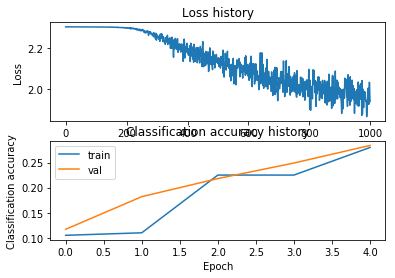

In [12]:
# Plot the loss function and train / validation accuracies
plt.subplot(2, 1, 1)
plt.plot(stats['loss_history'])
plt.title('Loss history')
plt.xlabel('Iteration')
plt.ylabel('Loss')

plt.subplot(2, 1, 2)
plt.plot(stats['train_acc_history'], label='train')
plt.plot(stats['val_acc_history'], label='val')
plt.title('Classification accuracy history')
plt.xlabel('Epoch')
plt.ylabel('Classification accuracy')
plt.legend()
plt.show()

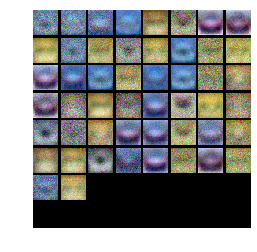

In [14]:
from cs231n.vis_utils import visualize_grid

# Visualize the weights of the network

def show_net_weights(net):
    W1 = net.params['W1']
    W1 = W1.reshape(32, 32, 3, -1).transpose(3, 0, 1, 2)
    plt.imshow(visualize_grid(W1, padding=3).astype('uint8'))
    plt.gca().axis('off')
    plt.show()

show_net_weights(net)

# Tune your hyperparameters

**What's wrong?**. Looking at the visualizations above, we see that the loss is decreasing more or less linearly, which seems to suggest that the learning rate may be too low. Moreover, there is no gap between the training and validation accuracy, suggesting that the model we used has low capacity, and that we should increase its size. On the other hand, with a very large model we would expect to see more overfitting, which would manifest itself as a very large gap between the training and validation accuracy.

**Tuning**. Tuning the hyperparameters and developing intuition for how they affect the final performance is a large part of using Neural Networks, so we want you to get a lot of practice. Below, you should experiment with different values of the various hyperparameters, including hidden layer size, learning rate, numer of training epochs, and regularization strength. You might also consider tuning the learning rate decay, but you should be able to get good performance using the default value.

**Approximate results**. You should be aim to achieve a classification accuracy of greater than 48% on the validation set. Our best network gets over 52% on the validation set.

**Experiment**: You goal in this exercise is to get as good of a result on CIFAR-10 as you can (52% could serve as a reference), with a fully-connected Neural Network. Feel free implement your own techniques (e.g. PCA to reduce dimensionality, or adding dropout, or adding features to the solver, etc.).

**Explain your hyperparameter tuning process below.**

$\color{blue}{\textit Your Answer:}$

In [ ]:
best_net = None # store the best model into this 

#################################################################################
# TODO: Tune hyperparameters using the validation set. Store your best trained  #
# model in best_net.                                                            #
#                                                                               #
# To help debug your network, it may help to use visualizations similar to the  #
# ones we used above; these visualizations will have significant qualitative    #
# differences from the ones we saw above for the poorly tuned network.          #
#                                                                               #
# Tweaking hyperparameters by hand can be fun, but you might find it useful to  #
# write code to sweep through possible combinations of hyperparameters          #
# automatically like we did on the previous exercises.                          #
#################################################################################
# *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

pass

# *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


In [ ]:
# visualize the weights of the best network
show_net_weights(best_net)

# Run on the test set
When you are done experimenting, you should evaluate your final trained network on the test set; you should get above 48%.

In [ ]:
test_acc = (best_net.predict(X_test) == y_test).mean()
print('Test accuracy: ', test_acc)

**Inline Question**

Now that you have trained a Neural Network classifier, you may find that your testing accuracy is much lower than the training accuracy. In what ways can we decrease this gap? Select all that apply.

1. Train on a larger dataset.
2. Add more hidden units.
3. Increase the regularization strength.
4. None of the above.

$\color{blue}{\textit Your Answer:}$

$\color{blue}{\textit Your Explanation:}$

